# PROJECT 1 - Analysis of PM10 concentration in air and regression with Gaussian Process

Anna Braghetto 1205200 - Davide Maniscalco 1212063

## _PM10_

_PM10_ is an acronym that indicated the _Particulate Matter_, consisting of several type of particles present in the atmosphere, whose aerodynmic diameter is less than $10\mu m$.
This _Particulate Matter_ is damage to human health: in fact more than half of _PM10_ is made up of particles whose dimensions (diameter less than $2.5\mu m$) are small enough to reach the pulmonary alveoli.

The sources of _Particulate Matter_ are of two type:

- *Natural*: vulcanin eruptions, soil erosion, forest fires...

- *Anthropogenic*: combustion processes such as heating, car traffic, industries...

## Analysis and Regression

We perform an analysis and a regression with Gaussian Process on the concentration pd _PM10_, using the data collected by one monitoring station in Rovigo - Largo Martiri. 
The data contains the _PM10_ concentrations daily collected during the last fifteen years.

At first, we make an introduction to the data, analyzing the evolution of the concentration over time, and then we perform the regression with a Gaussian Process.

#### We import the required packages.

In [1]:
#importing the packages

library(corrplot)
library(ggplot2)
library(gdata)
library(itertools)
library(GauPro)
library(latex2exp)

corrplot 0.84 loaded
gdata: read.xls support for 'XLS' (Excel 97-2004) files ENABLED.

gdata: read.xls support for 'XLSX' (Excel 2007+) files ENABLED.

Attaching package: ‘gdata’

The following object is masked from ‘package:stats’:

    nobs

The following object is masked from ‘package:utils’:

    object.size

The following object is masked from ‘package:base’:

    startsWith

Loading required package: iterators


We load the data contained in a _csv_ file and we inspect them.

In [2]:
data <- read.table('pm10.csv', header=T)
data[data == 0] <- NA
summary(data)

      DAY             X2004            X2005           X2006       
 Min.   :  1.00   Min.   :  1.00   Min.   :  1.0   Min.   :  5.00  
 1st Qu.: 92.25   1st Qu.: 24.00   1st Qu.: 27.0   1st Qu.: 28.25  
 Median :183.50   Median : 38.00   Median : 42.0   Median : 43.00  
 Mean   :183.50   Mean   : 48.23   Mean   : 47.6   Mean   : 48.28  
 3rd Qu.:274.75   3rd Qu.: 66.00   3rd Qu.: 63.0   3rd Qu.: 60.75  
 Max.   :366.00   Max.   :171.00   Max.   :170.0   Max.   :143.00  
                  NA's   :57       NA's   :47      NA's   :40      
     X2007            X2008            X2009            X2010       
 Min.   :  1.00   Min.   :  1.00   Min.   :  8.00   Min.   :  5.00  
 1st Qu.: 26.00   1st Qu.: 22.00   1st Qu.: 23.00   1st Qu.: 22.75  
 Median : 36.00   Median : 31.00   Median : 32.50   Median : 31.50  
 Mean   : 41.55   Mean   : 37.41   Mean   : 37.88   Mean   : 35.57  
 3rd Qu.: 53.25   3rd Qu.: 49.00   3rd Qu.: 47.00   3rd Qu.: 45.00  
 Max.   :121.00   Max.   :150.00   Max.   

A first vision of the data is performed by showing the concentration of _PM10_ for a sample year.

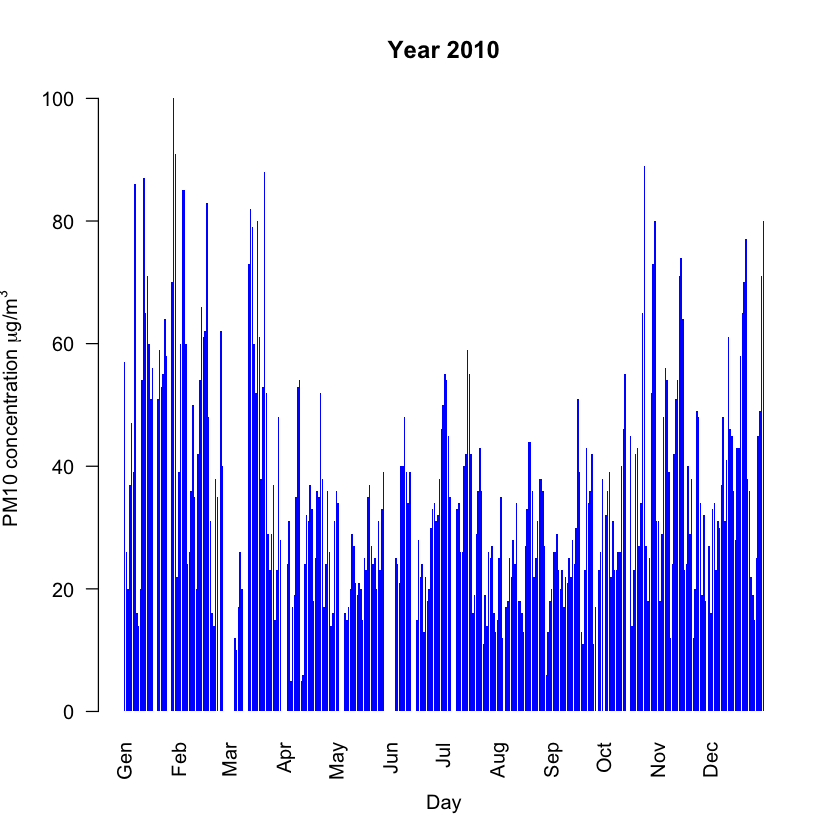

In [3]:
#to add the months to the plot
months <- c('Gen',rep('', 30),'Feb',rep('', 28),'Mar',rep('', 30),'Apr',rep('', 29),'May',rep('', 30),
            'Jun',rep('', 29),'Jul',rep('', 30),'Aug',rep('', 30),'Sep',rep('', 29),'Oct',rep('', 30),
            'Nov',rep('', 29),'Dec',rep('', 30))
#barplot for 2010
barplot(data$X2010, col='blue',border=NA,  names.arg=months, las=2, ylab=TeX('PM10 concentration $\\mu g/m^3$'), xlab='Day', main='Year 2010')

The concentrantion of _PM10_ is higher during the coolest months and lower during the hottest ones.

In order to observe the annual behaviour of the concentration during fifteen year, we compute the monthly average _PM10_ concentration.

In [4]:
#remove the first col in order to use the apply function over all the cols with PM10 concentration
analysis <- data
analysis['DAY'] <- NULL

In [5]:
#function that compute the mean per month
MeanMonth <- function(x) {
    Mean <- rep(0,12)
    months <- c(1, 31, 60, 91, 121, 152, 182, 213, 244, 274, 305, 335, 366)
    for(i in 1:12) {
        Mean[i] <- mean(x[months[i]:months[i+1]], na.rm=T) #bisogna mettere months[i]+1 e mettere 0 al primo el. di months in luogo di 1
    }  
    return(Mean)
}

MM.PM10 <- as.data.frame(apply(analysis, 2, MeanMonth))

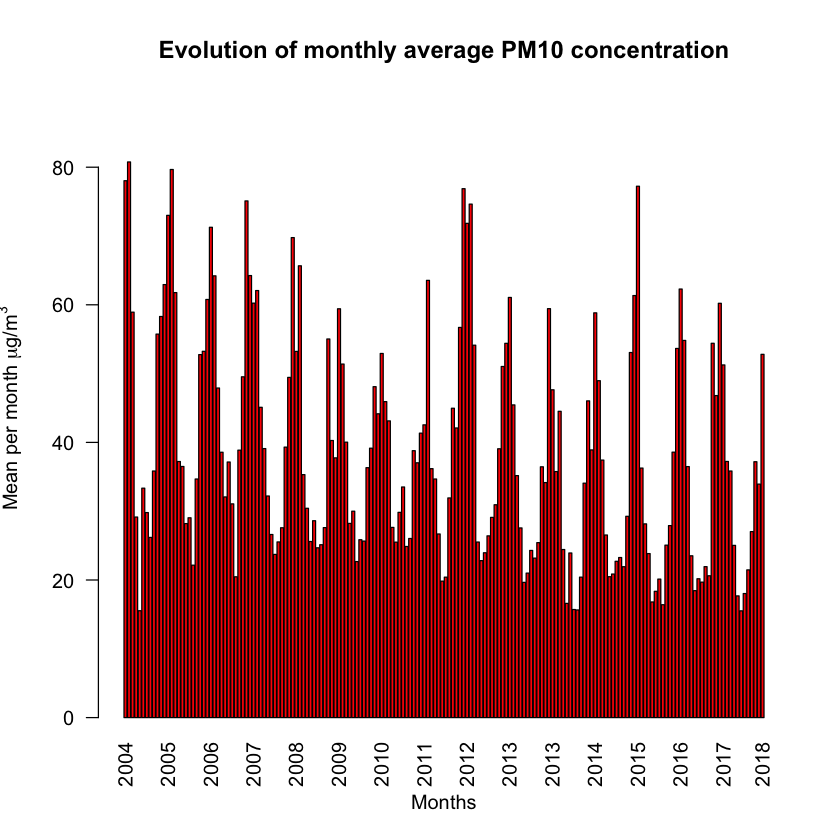

In [6]:
#we plot the time evolution of the PM10 concentration
years <- c('2004',rep('', 11),'2005',rep('', 11),'2006',rep('', 11),'2007',rep('', 11),'2008',
          rep('', 11),'2009',rep('', 11),'2010',rep('', 11),'2011',rep('', 11),'2012',rep('', 11),'2013',
          rep('', 11),'2013',rep('', 11),'2014',rep('', 11),'2015',rep('', 11),'2016',rep('', 11),'2017',
          rep('', 10),'2018')

barplot(as.vector(as.matrix(MM.PM10)), col='red',ylim=c(0,90), xlab='Months', ylab=TeX('Mean per month $\\mu g/m^3$'),names.arg=years, las=2,main='Evolution of monthly average PM10 concentration')

The evolution during one single year is the same for all: high concentration in winter and low in summer.

In order to observe better how the evolution changes during the last fifteen years, we compute the annual average _PM10_ concentration.

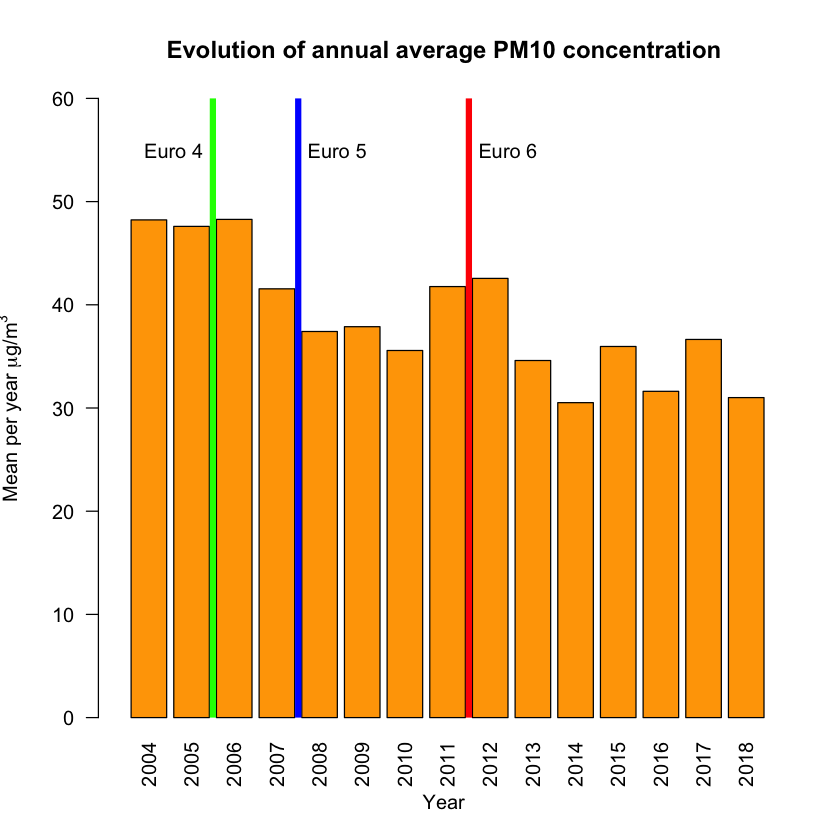

In [7]:
#we plot the annual average of PM10 concentration

#compute the annual average
YM.PM10 <- colMeans(x=analysis, na.rm = TRUE)

years <- c(2004:2018)
barplot(YM.PM10, col='orange',xlim=c(0,18), ylim=c(0, 60), xlab='Year', ylab=TeX('Mean per year $\\mu g/m^3$'), width=1,names.arg=years, las=2,main='Evolution of annual average PM10 concentration')
abline(v=2.5, col='green', lw=5)
abline(v=4.9, col='blue', lw=5)
abline(v=9.7, col='red', lw=5)
text(2.8/2, 55, label = 'Euro 4')
text(6, 55, label = 'Euro 5')
text(10.8, 55, label = 'Euro 6')

During the last fifteen years, the concentration of _PM10_ has decreased, thanks also to the new rules such as the use of particulate filters applied to the cars.

### Correlation between concentration of _PM10_ and temperature

The concentration of _PM10_ seems to increase in winter and to decrease in summer, as shown above. Since the _Particulate Matter_ is, in part, produced by the urban heating, we think that there is a correlation between its concentration and temperature. In fact, as the temperature decreases, the domestic heating, produced for example through the combustion of wood, increases, and with it, also the concentration of _Particulate Matter_. 

The data containing the temperature are collected from: http://www.arpa.veneto.it/dati-ambientali/open-data/clima/principali-variabili-meteorologiche. 

The temperature are collected by one monitoring station in Sant'Ampollinare (RO), at a distance of about $6 km$ from Largo Martiri (RO), where the concentrations of _PM10_ are measured.

In [8]:
MM.Temp <- read.table('temperature.csv', header=T)
MM.Temp <- MM.Temp[-c(13), ] 

The data used for the temperature analysis contains the mean of the average monthly temperatures during the last years. These values are compared with the monthy average of the concentration of _PM10_.

We plot the behaviour of the temperature next to the _PM10_ concentration and the correlation between them for a sample year.

In [9]:
#correlation function
CorrTempPM10 <- function(x, y){
    Year <- data.frame(x,y)
    colnames(Year) <- c('Temperature','PM10')
    corrplot(cor(Year, use="complete.obs"),type='upper',method = "pie")
}

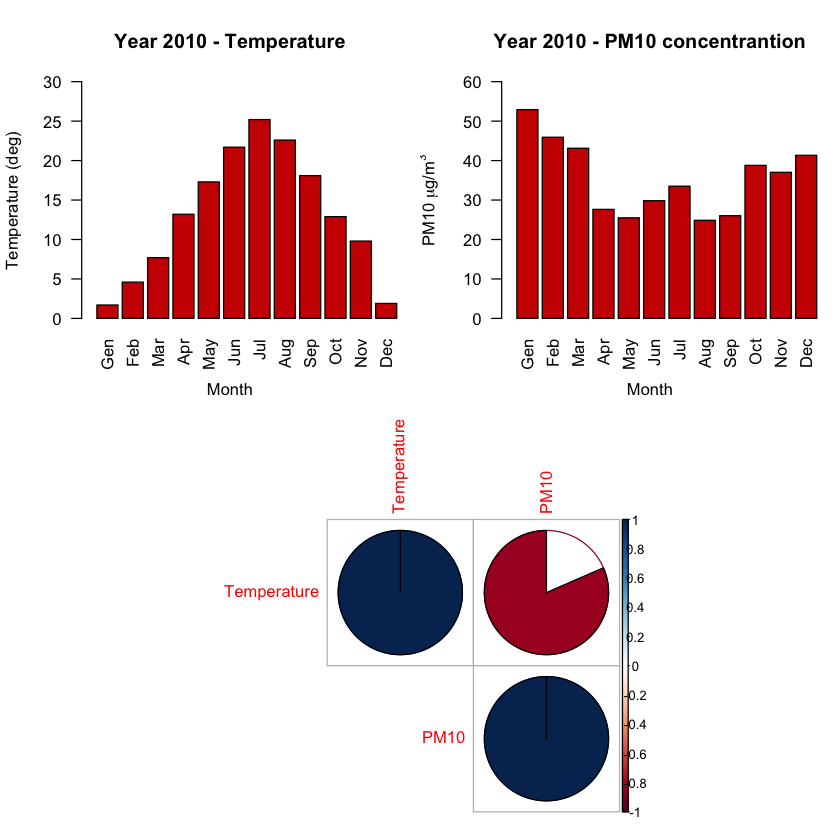

In [10]:
#plot
m <- matrix(c(1,2,3,3),nrow = 2,ncol = 2,byrow = TRUE)
layout(mat = m)

months <- c('Gen','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec')

barplot(MM.Temp$X2010,col='red3',xlim=c(0,13), ylim=c(0, 30), xlab='Month', ylab='Temperature (deg)',names.arg=months, las=2,main='Year 2010 - Temperature')
barplot(MM.PM10$X2010,col='red3',xlim=c(0,13), ylim=c(0, 60), xlab='Month', ylab=TeX('PM10 $\\mu g/m^3$'),names.arg=months, las=2,main='Year 2010 - PM10 concentrantion')
CorrTempPM10(MM.Temp$X2010, MM.PM10$X2010)

As expected, it is possibile to observe a high anticorrelation between the 2 features. Below, we show the correlations for all the years.

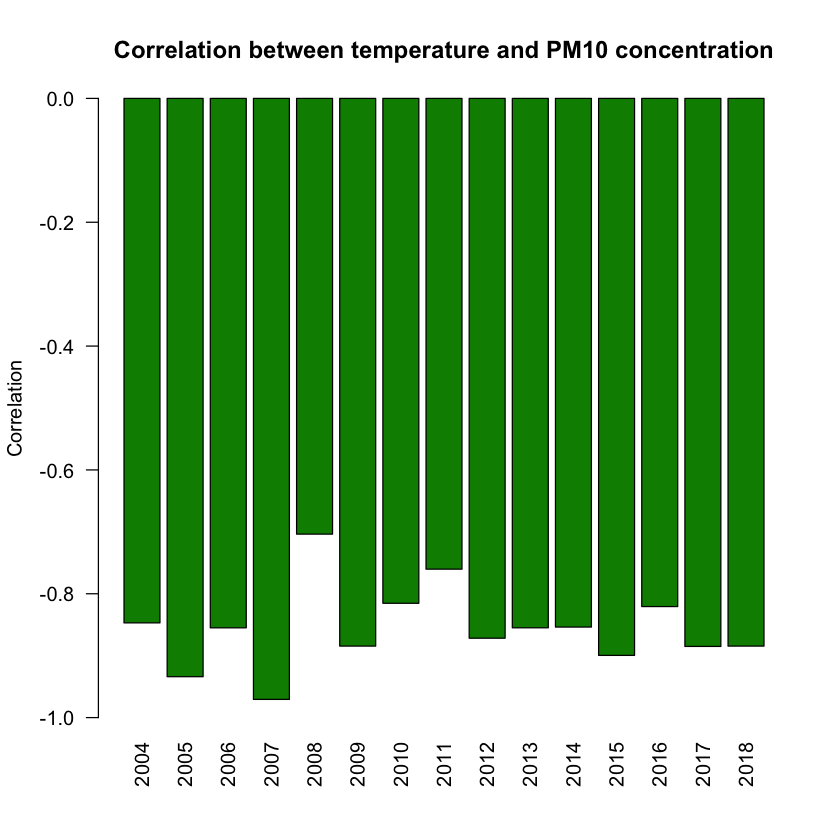

In [11]:
#function that compute the correlation between temperature and concentration of PM10
CorrPerYear <- function(temp,pm10){
    Correlation <- rep(0,15)
    for(i in 1:15) {
        Year <- data.frame(temp[,i+1],pm10[,i])
        Correlation[i] <- cor(Year, use="complete.obs")[2,1]
    }
    return(Correlation)
}

Correlation <- CorrPerYear(MM.Temp,MM.PM10)


years <- c(2004:2018)
barplot(Correlation,horiz=F,col='green4',ylim=c(-1,0),names.arg=years, las=2, ylab='Correlation', main='Correlation between temperature and PM10 concentration')

As expected, for all the years, except for 2008 and 2001, the correlation between temperature and concentration of particulate matter, is less than $-0.8$.

### Gaussian Process Regression

As explained above, we perform a regression with a __Gaussian Process__.

A Gaussian Process (GP) _is a collection of random variables, any finite number of which have a joint Gaussian Distribution_.

By defining the mean $m(\textbf{x})$ and the covariance matrix $k(\textbf{x},\textbf{x'})$ of a real process $f(\textbf{x})$, it is possible to specify the GP as

$$f(\textbf{x}) \sim GP(m(\textbf{x}),k(\textbf{x},\textbf{x'}))$$

The covariance function $cov(f(\textbf{x}),f(\textbf{x'})) = k(\textbf{x},\textbf{x'})$ defines the covariance between couples of variables by using the kernel trick: the covariance between two outputs ($f(\textbf{x}),f(\textbf{x'})$) is computed as a function of the inputs ($\textbf{x},\textbf{x'}$) in a higher space.

The kernel $k$ could be any arbitrary functions of $(\textbf{x},\textbf{x'})$, such as:

- Gaussian: $k(\textbf{x},\textbf{x'}) = e^{-\epsilon||\textbf{x}-\textbf{x'}||^2}$
- Inverse Quadratic $k(\textbf{x},\textbf{x'}) = \frac{1}{1+\epsilon||\textbf{x}-\textbf{x'}||^2}$
- Inverse Multiquadratic $k(\textbf{x},\textbf{x'}) = \frac{1}{\sqrt{1+\epsilon||\textbf{x}-\textbf{x'}||^2}}$

At first we define the prior: from unseen data $x_*$, called _test data_ (whose number is arbitrary), we compute covariance matrix $K(x_*,x_*)$ choosing one of the kernel functions:

$$ K(x_*,x_*) = k(x_*,x_*,\epsilon )$$

Computed the covariance, it is possible to draw the priors as follows:

$$f_{prior} \sim N(0,K(x_*,x_*))$$

Defined the _training data_ $(x,y)$ as are our observation, the joint distribution between $f^*$ and $y$ is

\begin{equation}
\begin{bmatrix}
y\\
f^*
\end{bmatrix}
\sim
N\left(
0,
\begin{bmatrix}
K(x,x)+\sigma^2\mathbb{1} \,\, K(x,x_*)\\
K(x_*,x) \,\, K(x_*,x_*)
\end{bmatrix}
\right)
\end{equation}

Using the same kernel function as above, we can calculate the matrices:

$$ K(x,x_*) \quad K(x_*,x) \quad K(x,x)$$

from which we can compute the mean and the covariance of the $y^*$_-points_ associated to the test points $x_*$:

$$ \mu(f_*) = K(x_*,x) [K(x,x)+\sigma^2\mathbb{1}]^{-1}y $$

$$ cov(f_*) = K(x_*,x_*) - K(x_*,x) [K(x,x)+\sigma^2\mathbb{1}]^{-1}K(x,x_*)$$

where $\sigma^2$ is the variance of the noise of the data, assuming that it follows a Gaussian distribution. In fact we consider that $f(x) = y + \sigma$ where _f_ is the real distribution followed by the _training data_. 

At last, the posterior is computed as:

$$f_* \sim N(\mu(f_*),cov(f_*)) $$

### Implementation of the Gaussian Process Regression

We set a seed necessary to have reproducible performance.

In [12]:
#initial seed
set.seed(12345)

We define the function that computes the covariance matrix with different kernels. In particular we perform the regression with the three different kernel shown above:

- Gaussian
- Inverse Quadratic
- Inverse Multiquadratic

In [13]:
#define Gaussian RBF

#e is the hyper-parameter
Gaussian <- function(a,b,e=1){
    #define the empty matrix K a,b
    K <- matrix(rep(0, length(a)*length(b)), nrow=length(a))
    for (i in 1:nrow(K)) {
        for (j in 1:ncol(K)) {
            #dist = norm(x-x')^2
            dist <- (a[i]-b[j])^2
            #computing Kij
            K[i,j] <- exp(-e*dist)
        }
      }
    return(K)
    }

In [14]:
#define Inverse Quadratic RBF

#e is the hyper-parameter
InverseQuadratic <- function(a,b,e=1){
    #define the empty matrix K a,b
    K <- matrix(rep(0, length(a)*length(b)), nrow=length(a))
    for (i in 1:nrow(K)) {
        for (j in 1:ncol(K)) {
            #dist = norm(x-x')^2
            dist <- (a[i]-b[j])^2
            #computing Kij
            K[i,j] <- 1/(1+e*dist)
        }
      }
    return(K)
    }

In [15]:
#define Inverse Multiquadratic RBF

#e is the hyper-parameter
InverseMQuadratic <- function(a,b,e=1){
    #define the empty matrix K a,b
    K <- matrix(rep(0, length(a)*length(b)), nrow=length(a))
    for (i in 1:nrow(K)) {
        for (j in 1:ncol(K)) {
            #dist = norm(x-x')^2
            dist <- (a[i]-b[j])^2
            #computing Kij
            K[i,j] <- 1/sqrt(1+e*dist)
        }
      }
    return(K)
    }

In [16]:
#define Solve to invert the matrix

#sigma is the measurement error
inverse <- function(Kernel,n,sigma=0.01){
    id <-diag(n)
    return(solve(Kernel+sigma^2*id))
}

We define a global function that performs the GP as explained above.

In [17]:
#to draw posterior and prior
require(MASS)

GaussianProcess <- function(Year, Kernel, HyperPar, MError, WhichGraphics='yyyy', yearname=2010) {
    
    #to do the plots
    number <- unlist(strsplit(WhichGraphics,""))
    
    #at first we define the test and the train data
    
    #Xtest
    n <- 400
    Xtest <- seq(1,366,len=n)
    
    #Xtrain and Ytrain
    #auxiliary data frame to remove rows with NA
    aux <- data.frame(x=c(1:366),y=Year)
    aux <- aux[complete.cases(aux),]
    Xtrain <- aux$x
    Ytrain <- aux$y
    
    
    #we draw some priors by computing the covariace matrix 𝐾(𝑥∗,𝑥∗) and then we plot them
    
    #we apply the kernel on Xtest
    K.ss <- Kernel(Xtest,Xtest,HyperPar)
    
    #draw and plot priors
    prior.1 <- mvrnorm(1,rep(0,n),K.ss)
    prior.2 <- mvrnorm(1,rep(0,n),K.ss)
    prior.3 <- mvrnorm(1,rep(0,n),K.ss)

    if(number[1]=='y') {
    plot(Xtest,prior.1,type='l',col='red', xlab='x*',ylab='f(x*)', 
         ylim=c(-3,3),
         main=paste('Priors, ',yearname, 'with: (',HyperPar,',',MError,')'))
    lines(Xtest,prior.2,col='blue')
    lines(Xtest,prior.3,col='green')}
    
    #we compute the posterior
    
    #we compute K(x,x), K(x*,x), K(x,x*), K(x*,x*) to determine the posterior
    K <- Kernel(Xtrain,Xtrain,HyperPar)
    K.s <- Kernel(Xtrain,Xtest,HyperPar)
    K.sT <- Kernel(Xtest,Xtrain,HyperPar)
    
    #computing f bar star and cov star
    mu.s <- K.sT%*%inverse(K, length(Xtrain), MError)%*%Ytrain
    cov.s <- K.ss - K.sT%*%inverse(K, length(Xtrain), MError)%*%K.s
    
    #draw and plot posteriors
    post.1 <- mvrnorm(1,mu.s,cov.s)
    post.2 <- mvrnorm(1,mu.s,cov.s)
    post.3 <- mvrnorm(1,mu.s,cov.s)
    
    if(number[2]=='y') {plot(Xtest,post.1,type='l',col='red', xlab='x*',
                             ylab=TeX('$f(x^*) \\,\\, \\mu g/m^3$'),
                             main=paste('Posteriors, ',yearname, 'with: (',HyperPar,',',MError,')'))
    lines(Xtest,post.2,col='blue')
    lines(Xtest,post.3,col='green')
    points(Xtrain,Ytrain)}
    
    
    #plot mu.s and std
    #pointwise variace is the diagonal of the covariance matrix
    pwvar.s <- diag(cov.s)
    if(number[3]=='y') plot(Xtest,mu.s, col='blue3', xlab='x*',ylab=TeX('$\\bar{f(x*)} \\,\\, \\mu g/m^3$'), 
                            main=paste('Mean, ',yearname, 'with: (',HyperPar,',',MError,')'))
        
    if(number[4]=='y') plot(Xtest, pwvar.s, col='blue3', xlab='x*',ylab=TeX('$\\sigma^{*}^{2} \\,\\, (\\mu g/m^3)^2$'), 
                            main=paste('Pointswise variance, ',yearname, 'with: (',HyperPar,',',MError,')'))
    
}

Loading required package: MASS


We show the results obtained by varying the hyper-parameter and the measurement error for different kernels.

### Gaussian Kernel or RBF Kernel

As an example we show the results for the year 2010 with different measurement error and hyperparameters.

#### 1) Keeping fixed the parameter, we vary the measurement error

We give a quick look at the graphics of posterior and variance for ten different orders of magnitude for the measurement error. It is clear that if the error is unwisely high, the prediction is completely wrong, while it works in the other cases. In the following, we will keep fixed $e = 1$ .

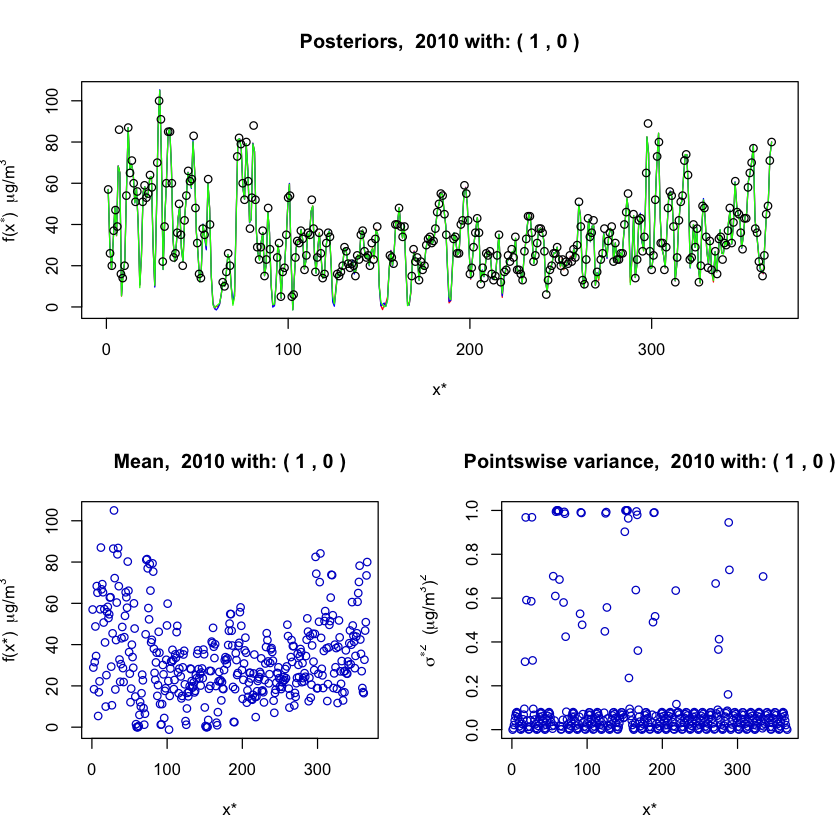

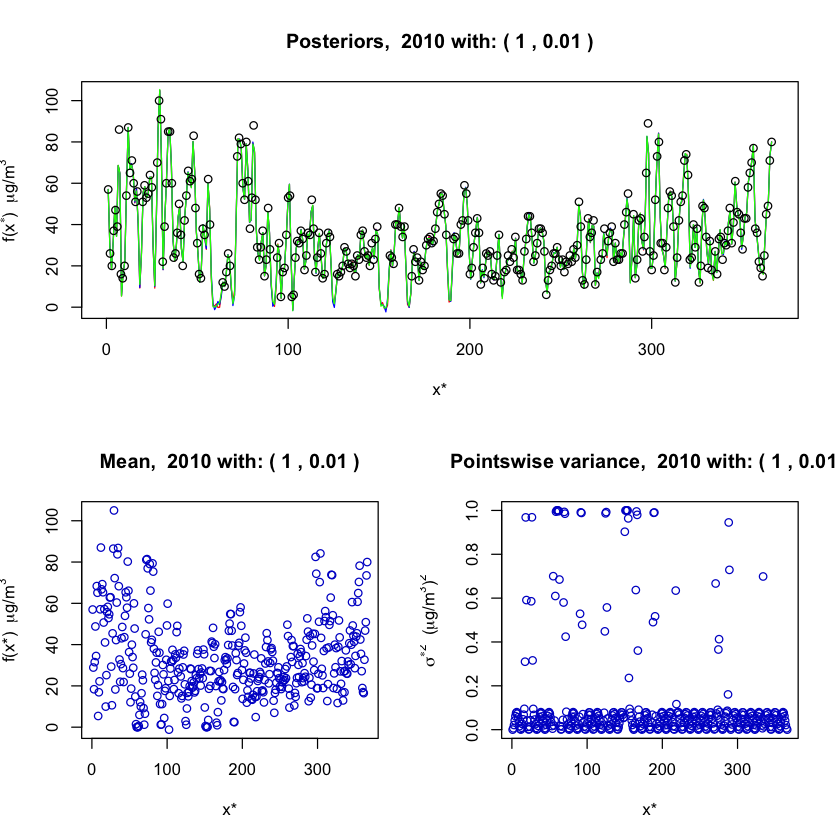

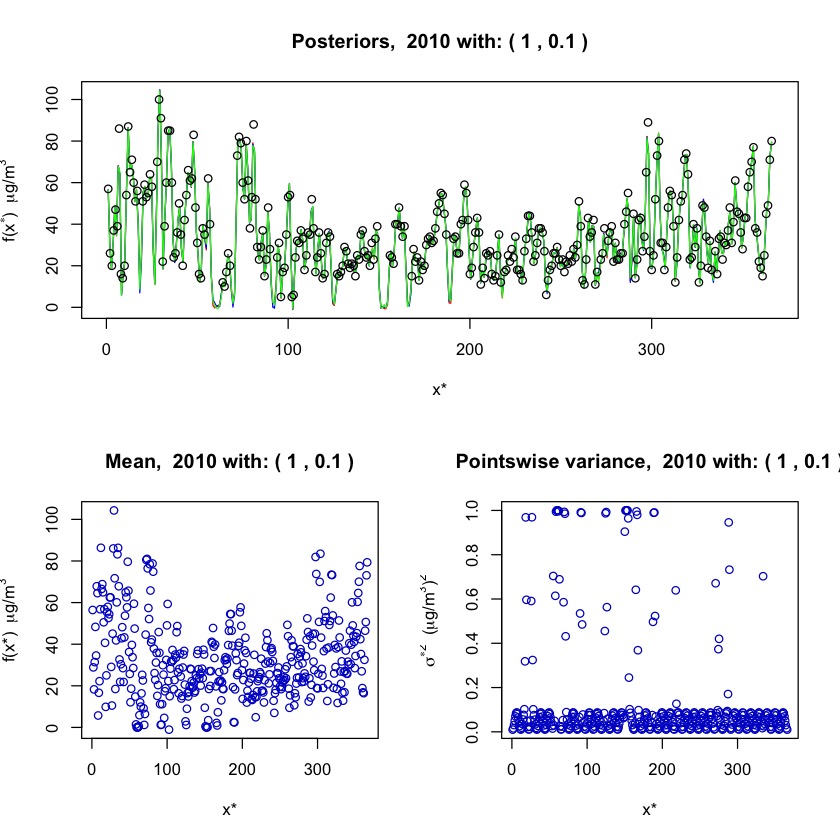

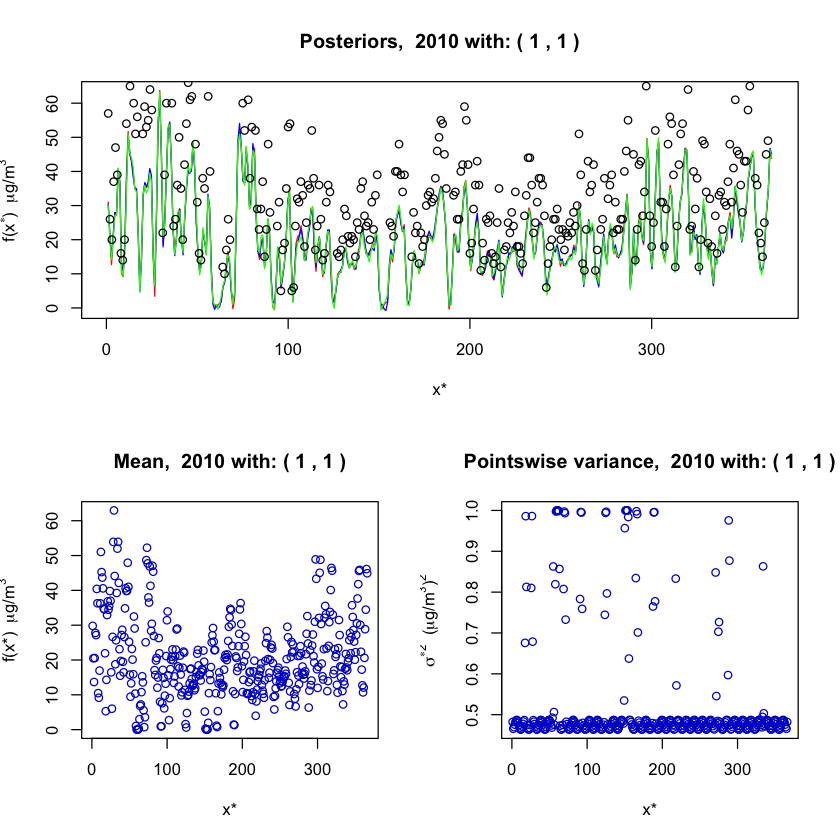

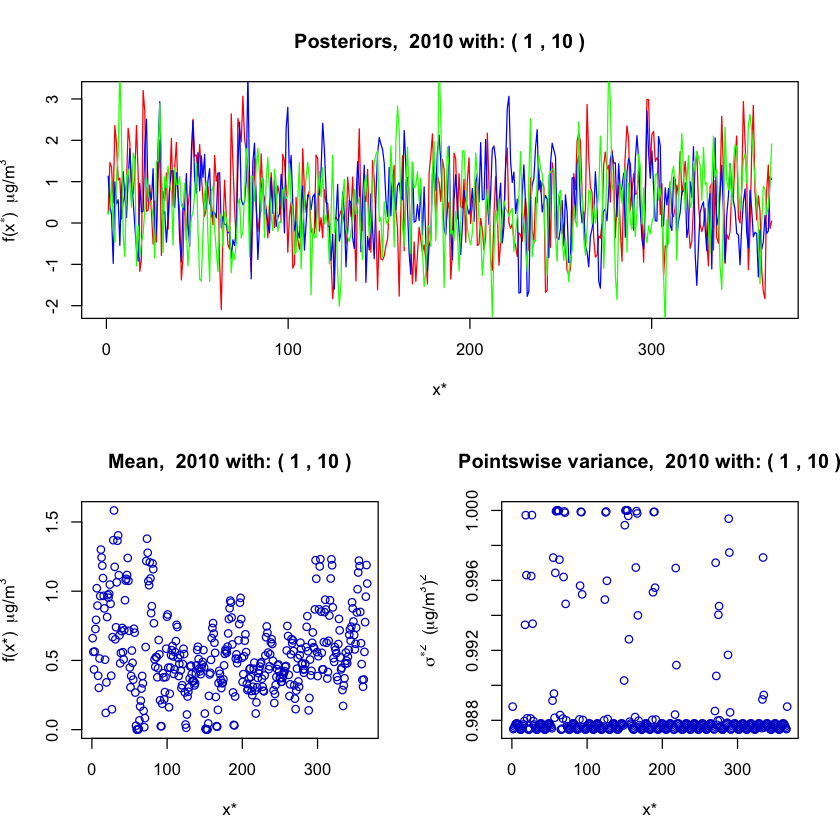

In [18]:
m <- matrix(c(1,1,2,3),nrow = 2,ncol = 2,byrow = TRUE)
layout(mat = m)
GaussianProcess(data$X2010, Gaussian, 1, 0,'nyyy')
for (i in seq(-2,1)) {
    m <- matrix(c(1,1,2,3),nrow = 2,ncol = 2,byrow = TRUE)
    layout(mat = m)
    GaussianProcess(data$X2010, Gaussian, 1, 10^i,'nyyy')
    }

#### 2) Keeping fixed the measurement error, we vary the hyperparameter.

We keep for the error $\sigma= 0.01$. Now we show all the graphics for three very different values of the hyperparameter.

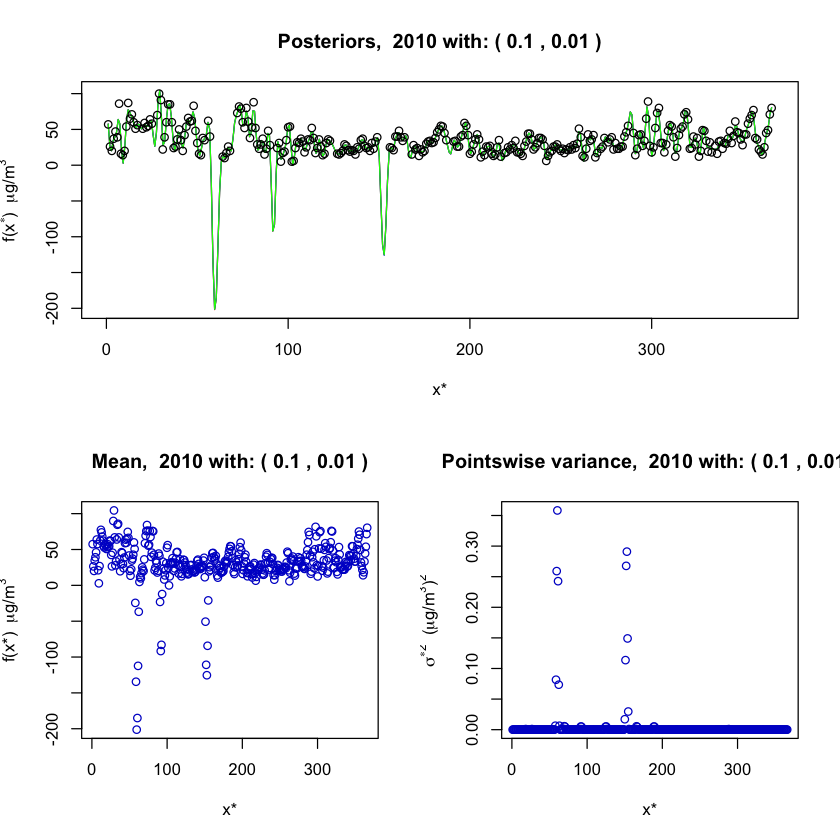

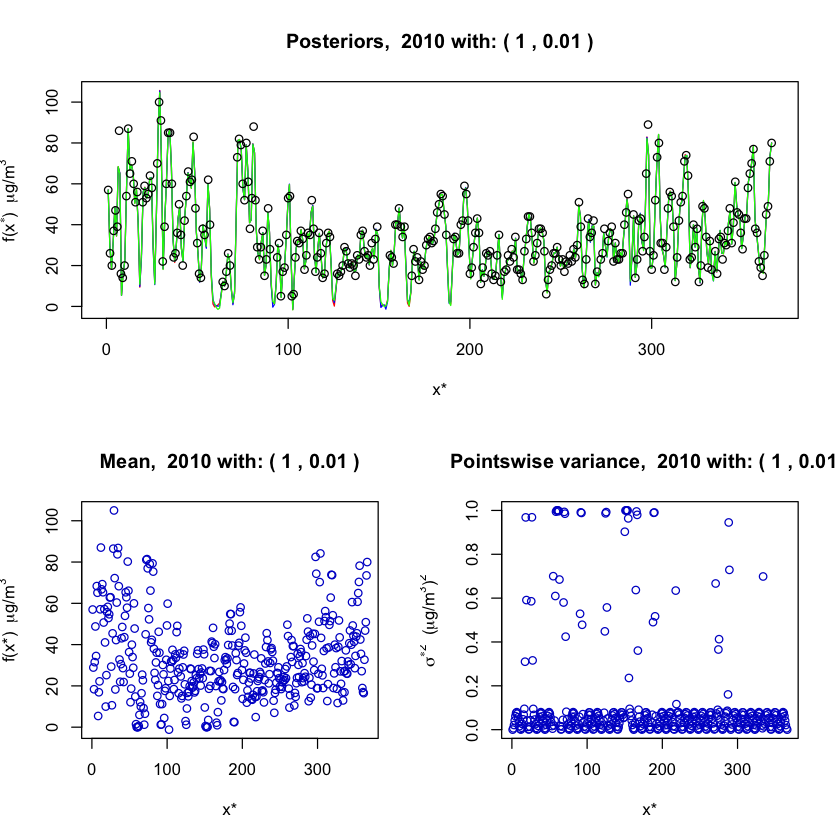

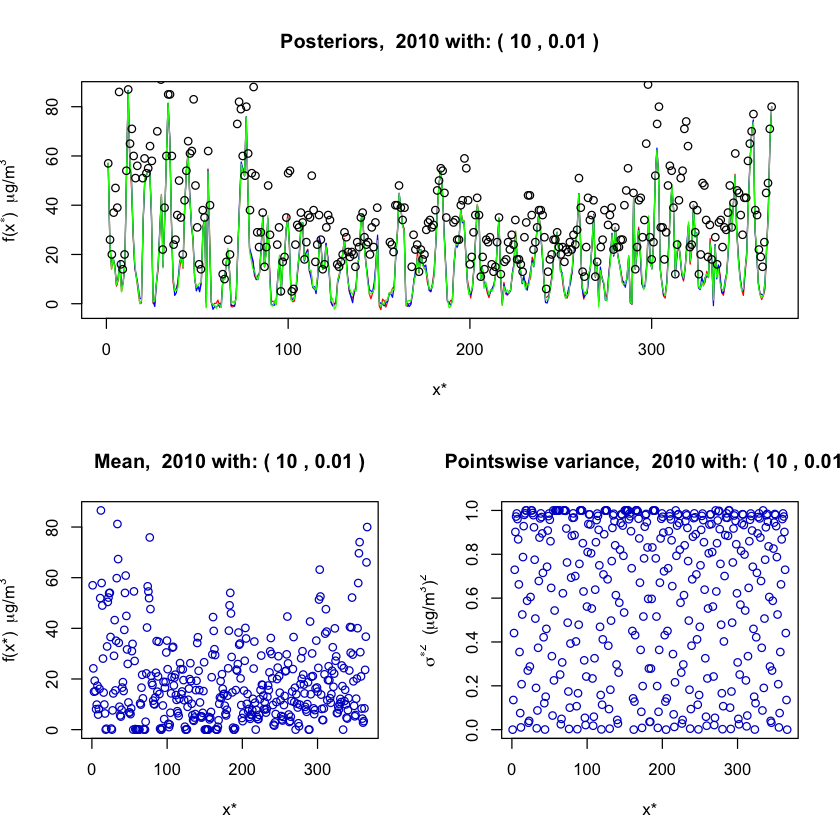

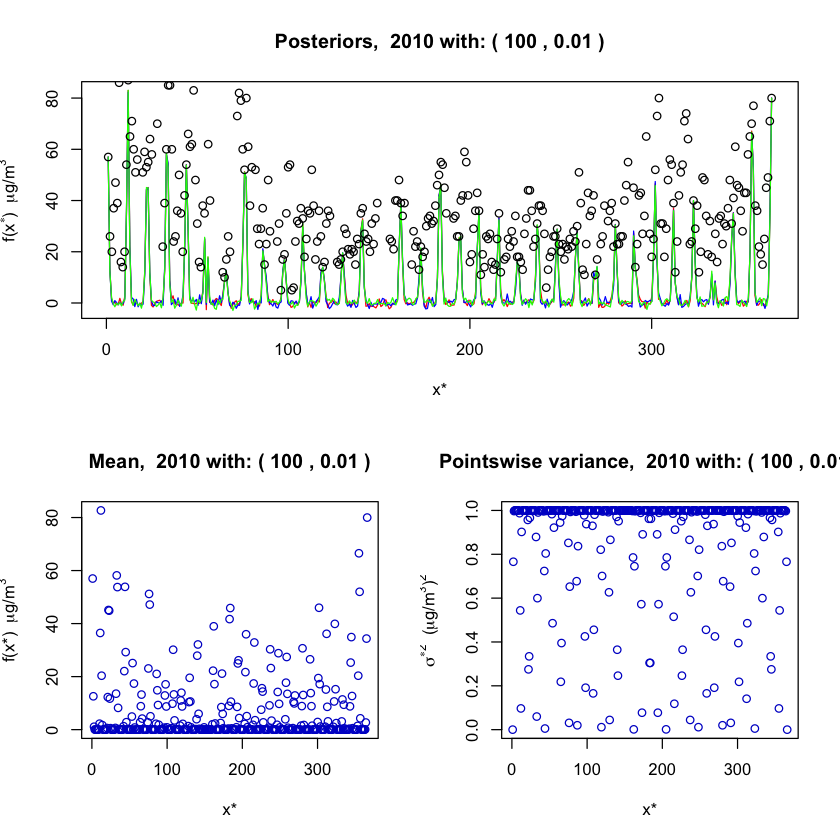

In [19]:
for (i in seq(-1,2)) {
        m <- matrix(c(1,1,2,3),nrow = 2,ncol = 2,byrow = TRUE)
    layout(mat = m)
    GaussianProcess(data$X2010, Gaussian, 10^i, 0.01,'nyyy')
    }

By changing the hyper_parameter, the smothness of the line changes: as the hyper-parameter decreases, the smothness increases.

Too high or too low values for the hyperparameter lead to a fail. In the former, the pointwise variance is very high and the posterior graphic clearly inadequate; the posterior (and the prior) is a kind smooth line, that doesn't take into account the spread of the fluctuations of the points.

$\epsilon = 1$ seems clearly to be a good choice.

#### Full years analysis

With this best choices of the parameters, we draw the grahics for all the years available in the dataset.

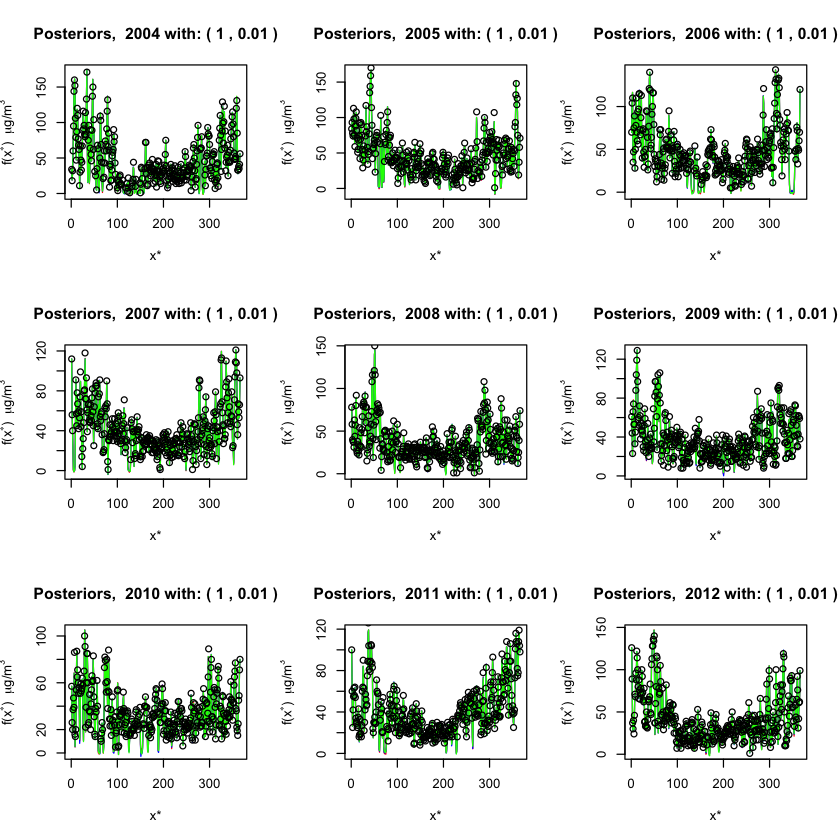

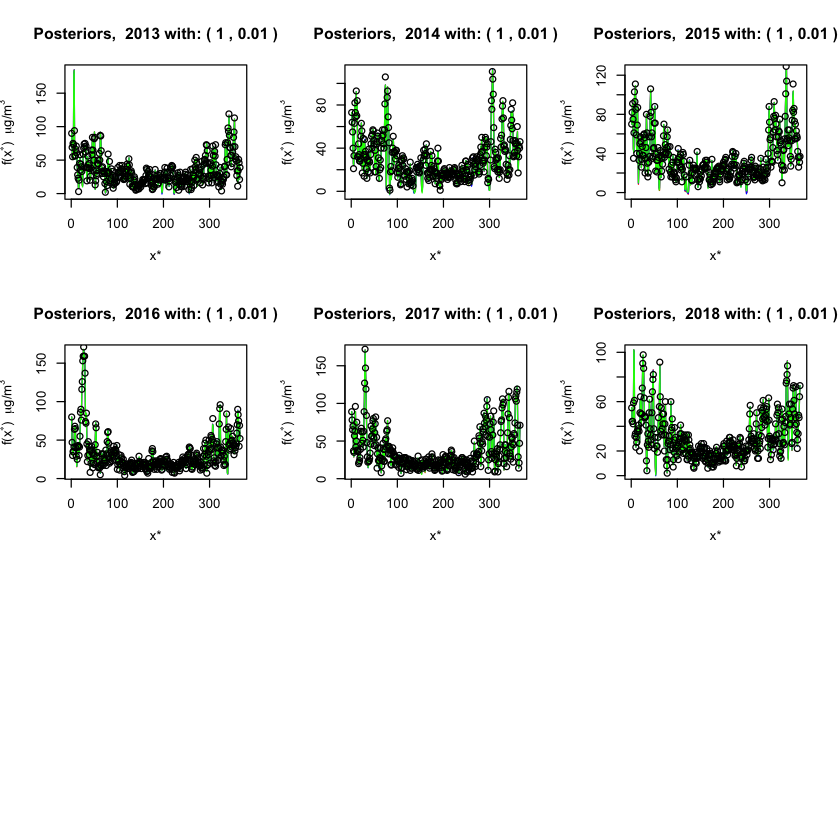

In [20]:
par(mfrow=c(3,3))
for (i in seq(2004,2018,1)){
    GaussianProcess(data[,i-2002], Gaussian, 1, 0.01,'nynn',i)
    }

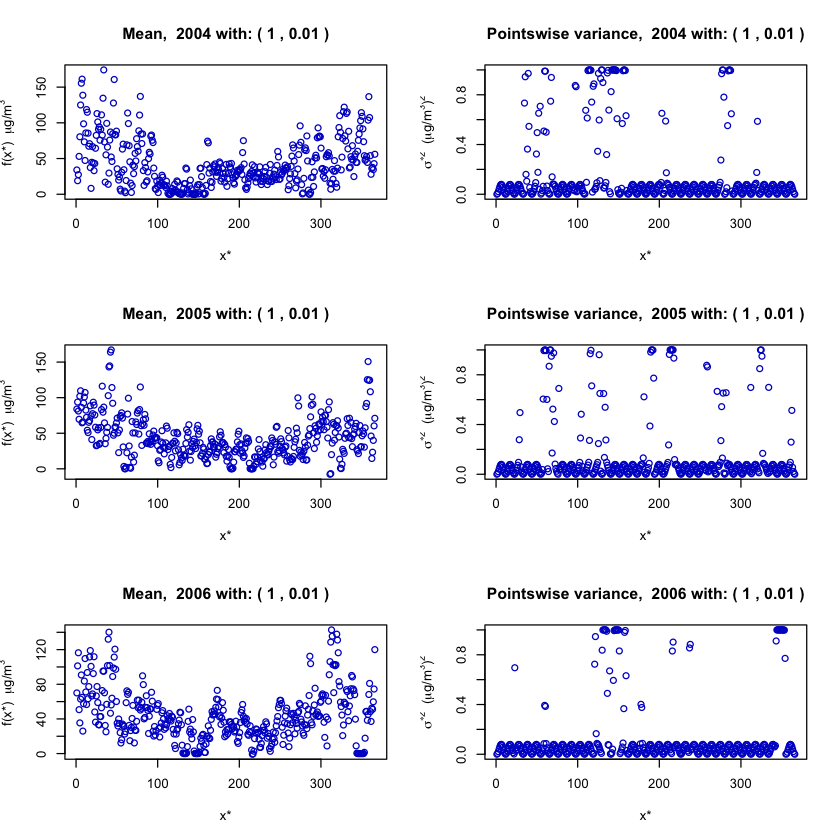

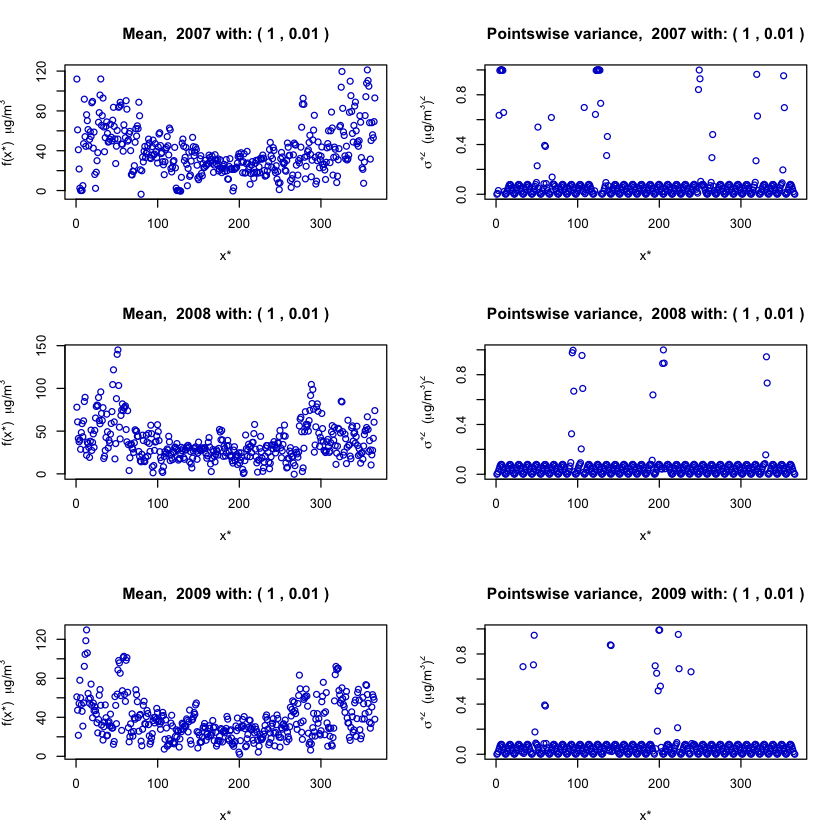

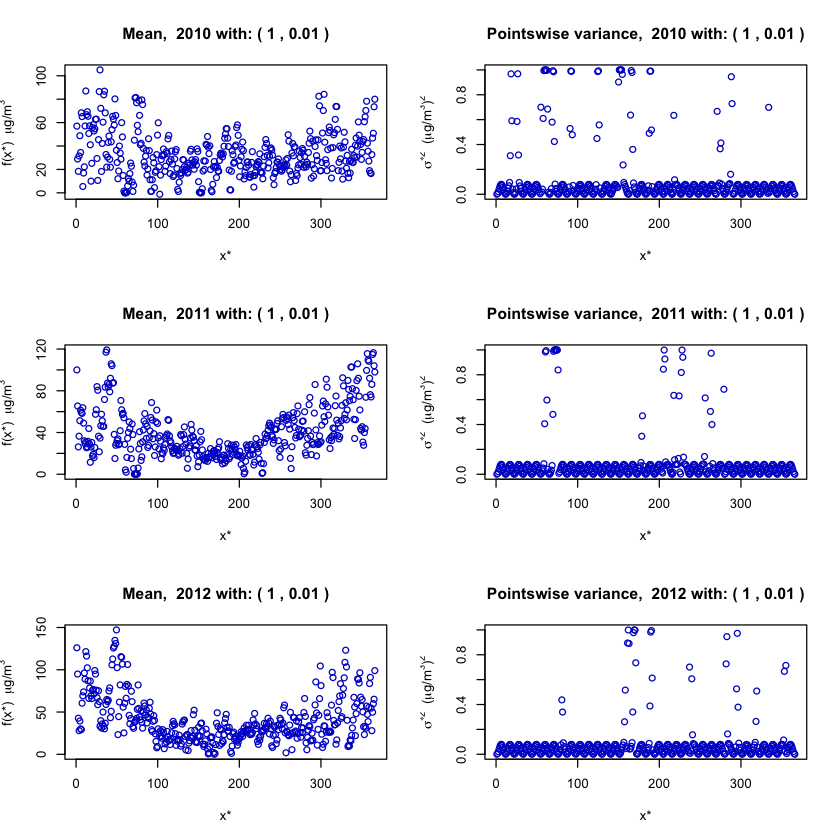

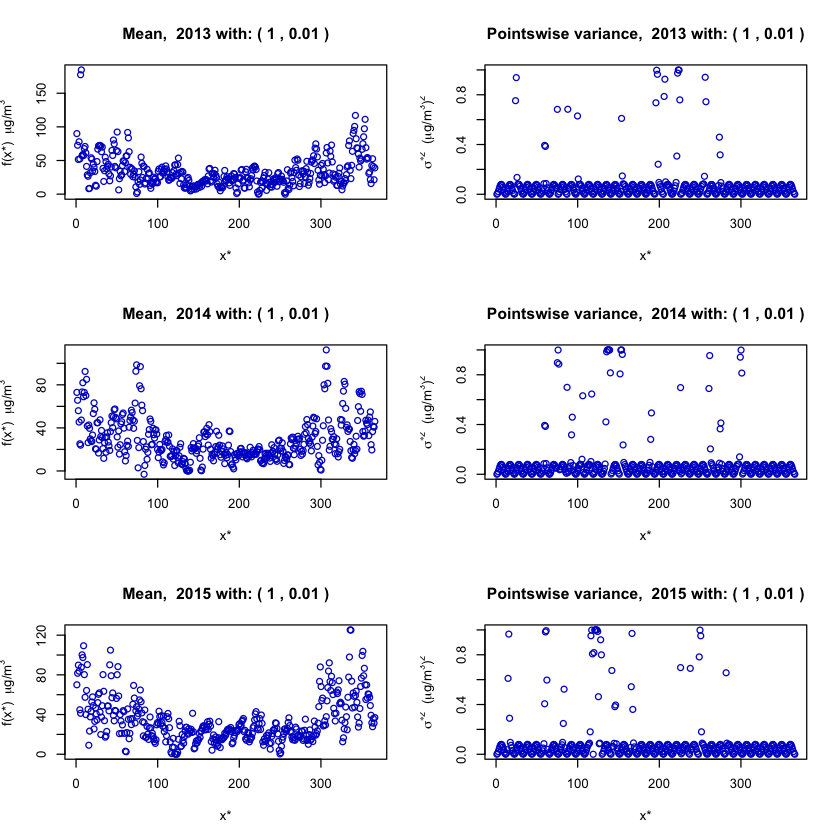

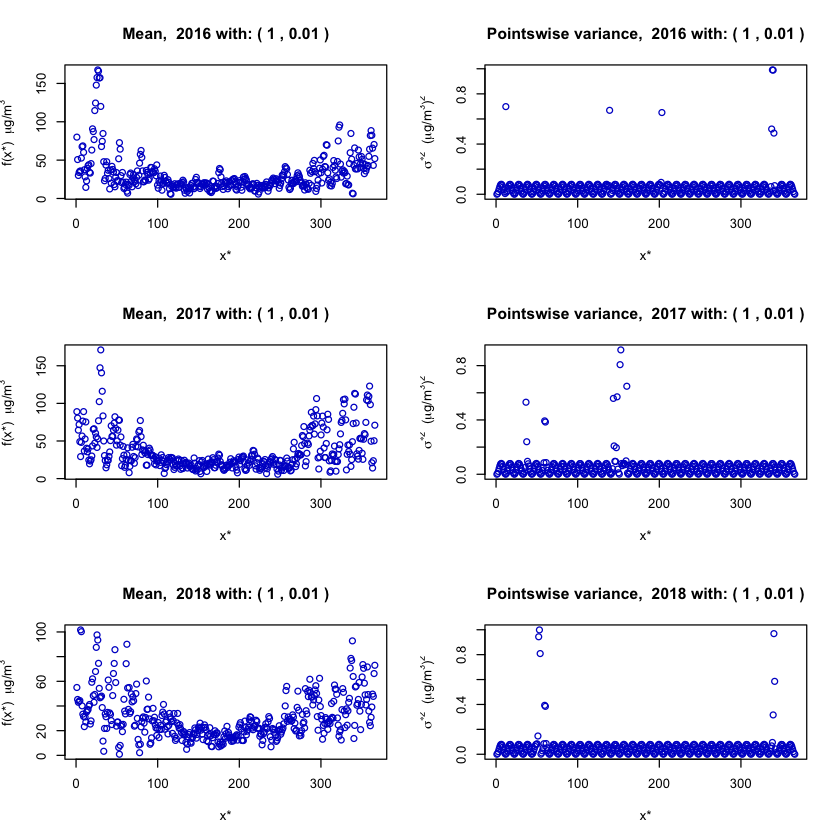

In [21]:
par(mfrow=c(3,2))
for (i in seq(2004,2018,1))
    {
    GaussianProcess(data[,i-2002], Gaussian, 1, 0.01,'nnyy',i)
    }

## Inverse Quadratic Kernel

For completeness, we perform the analysisis for the year 2010 using also InverseQuadratic. Again we look for the best parameters as above.

#### 1) Keeping fixed the parameter, we vary the measurement error

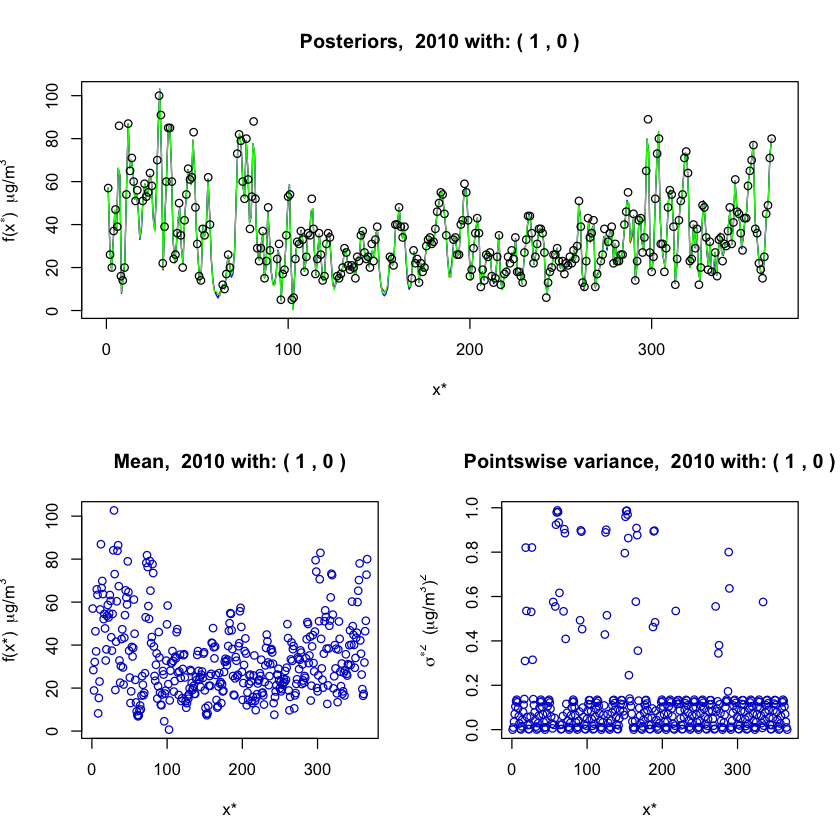

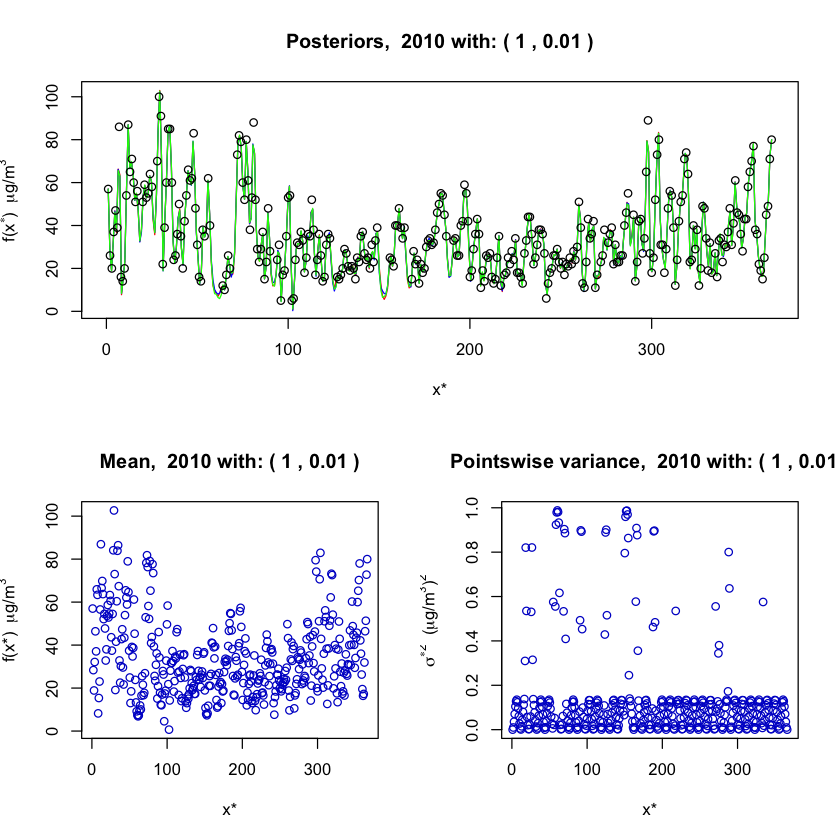

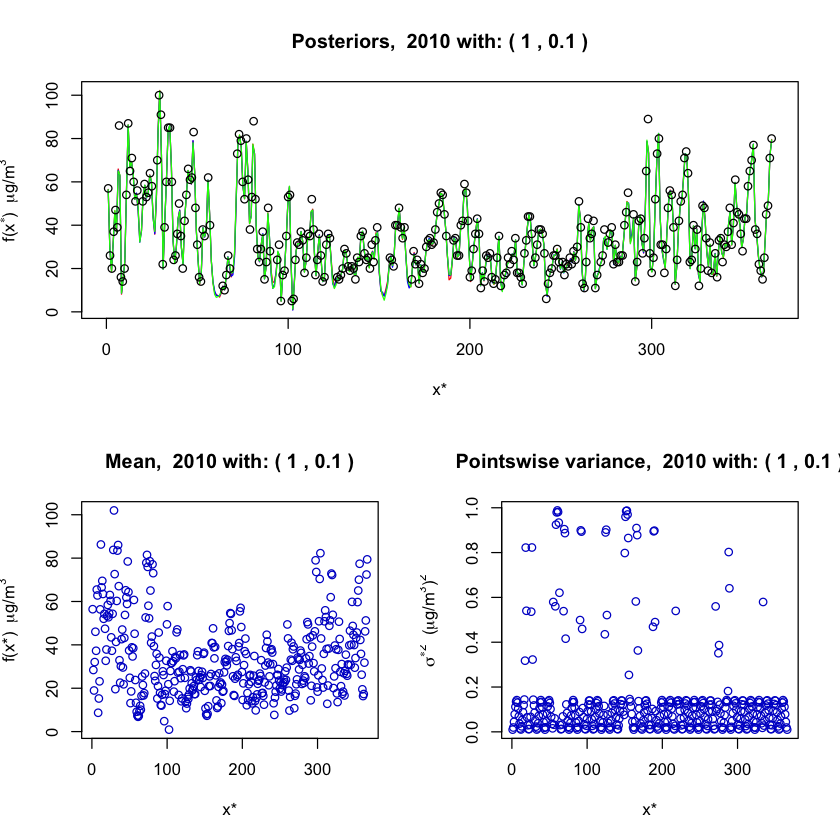

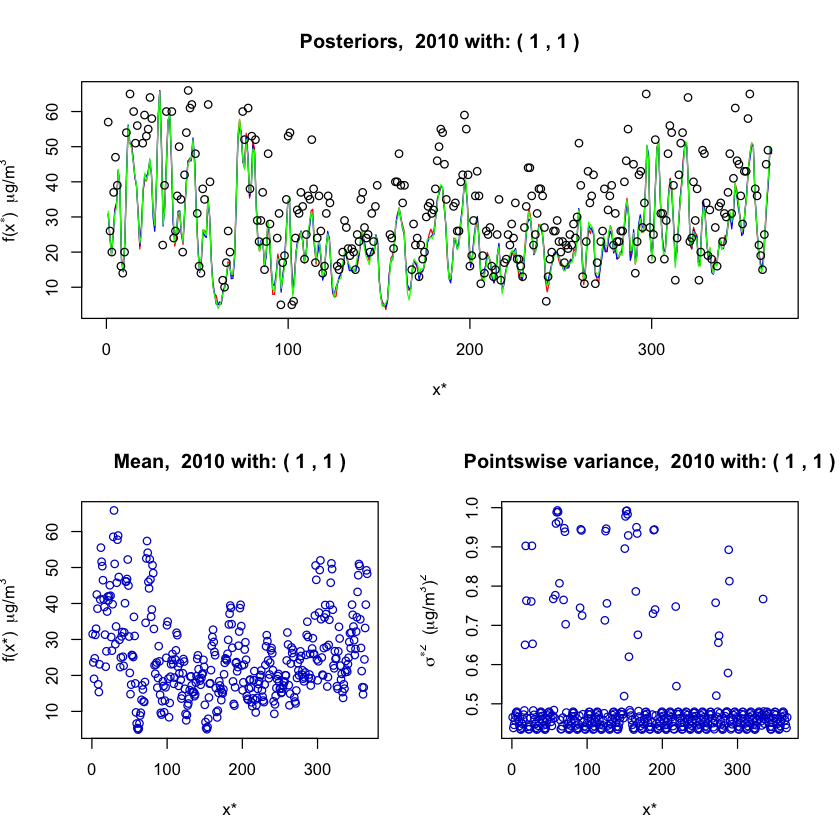

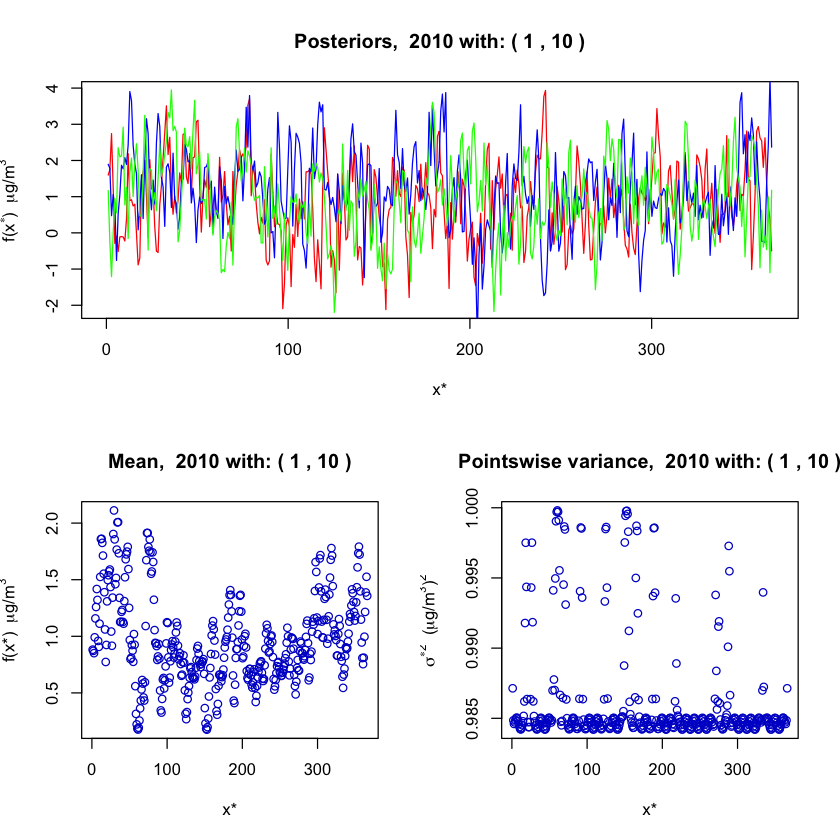

In [22]:
m <- matrix(c(1,1,2,3),nrow = 2,ncol = 2,byrow = TRUE)
layout(mat = m)
GaussianProcess(data$X2010, InverseQuadratic, 1, 0,'nyyy')
for (i in seq(-2,1)) {
    m <- matrix(c(1,1,2,3),nrow = 2,ncol = 2,byrow = TRUE)
    layout(mat = m)
    GaussianProcess(data$X2010, InverseQuadratic, 1, 10^i,'nyyy')
    }

#### 2) Keeping fixed the measurement error, we vary the hyperparameter.

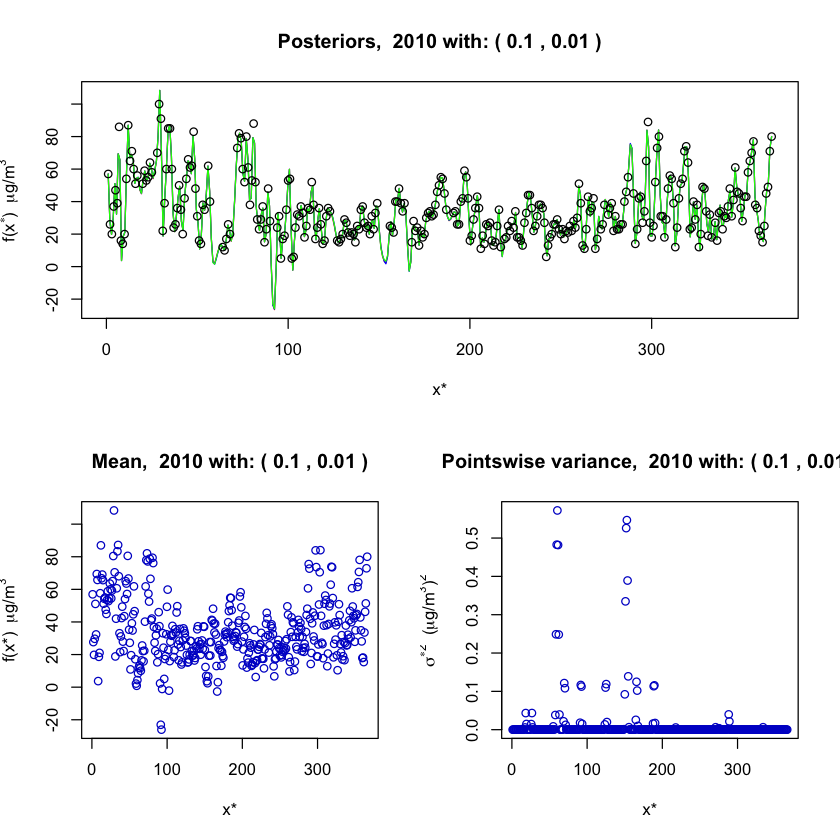

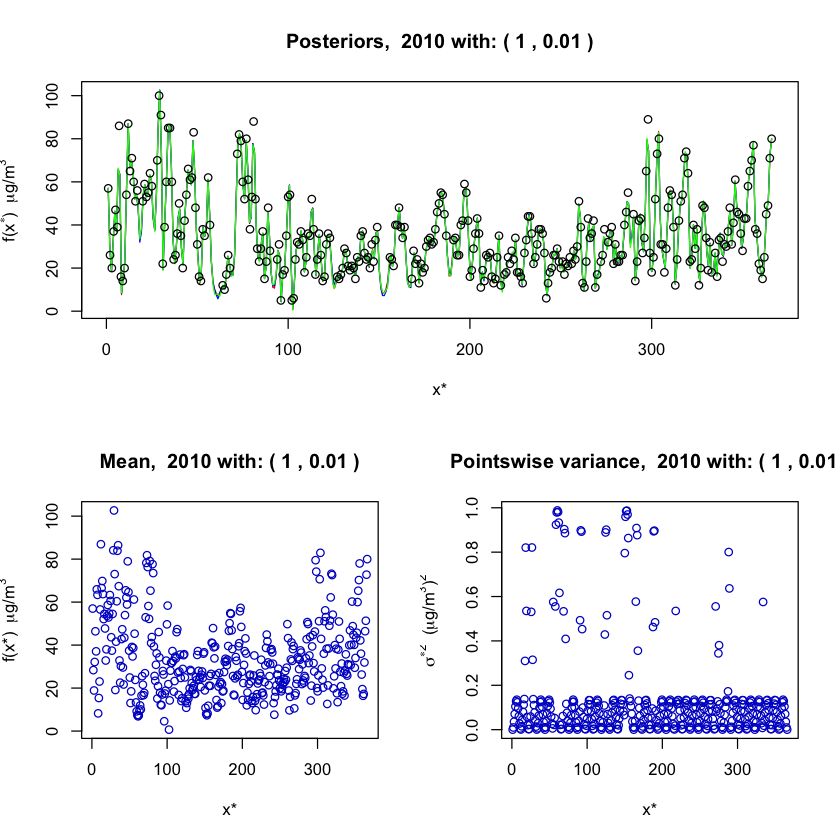

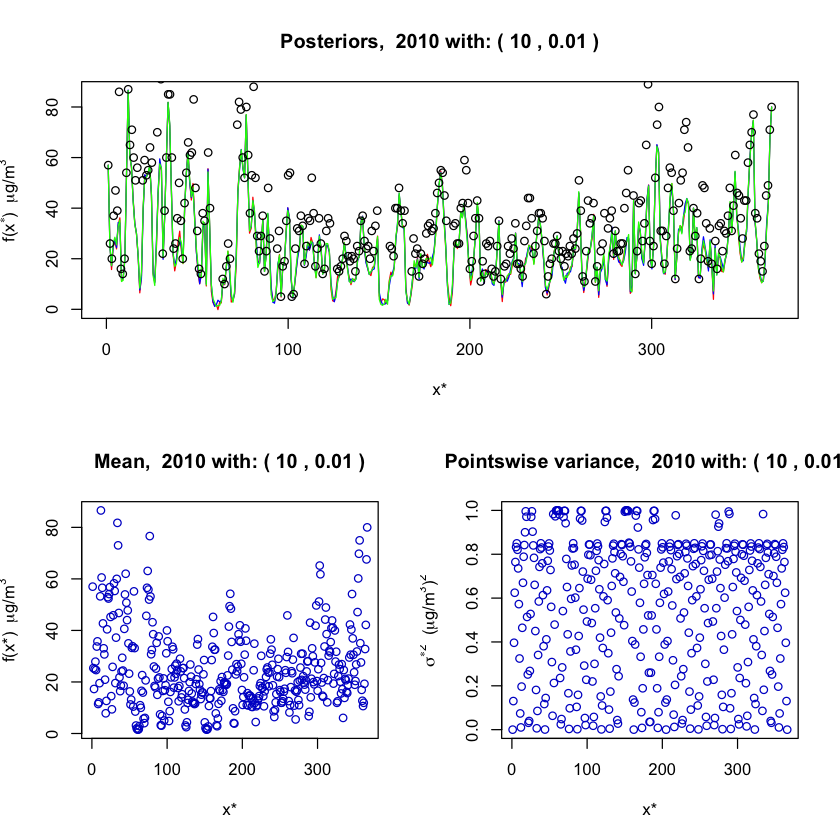

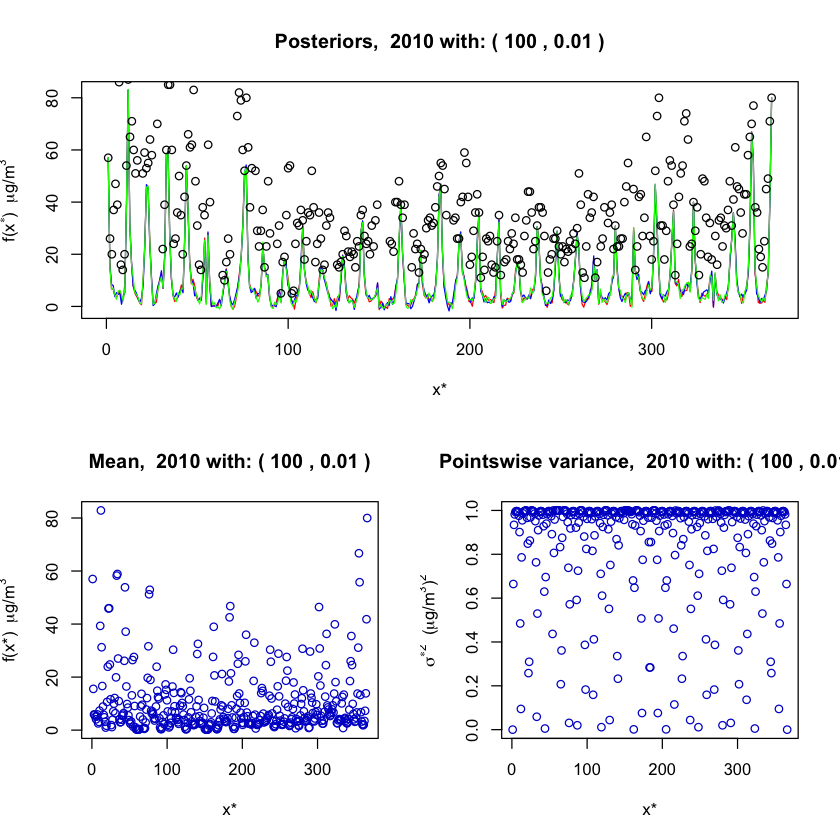

In [23]:
for (i in seq(-1,2)) {
        m <- matrix(c(1,1,2,3),nrow = 2,ncol = 2,byrow = TRUE)
    layout(mat = m)
    GaussianProcess(data$X2010, InverseQuadratic, 10^i, 0.01,'nyyy')
    }

For the same considearations done above, the best parameters are: $\sigma=0.01$ and $e=1$.

## Inverse Multiquadratic Kernel

Then, we perform the analysisis for the year 2010 using also InverseMQuadratic. Again we look for the best parameters as above.

#### 1) Keeping fixed the parameter, we vary the measurement error

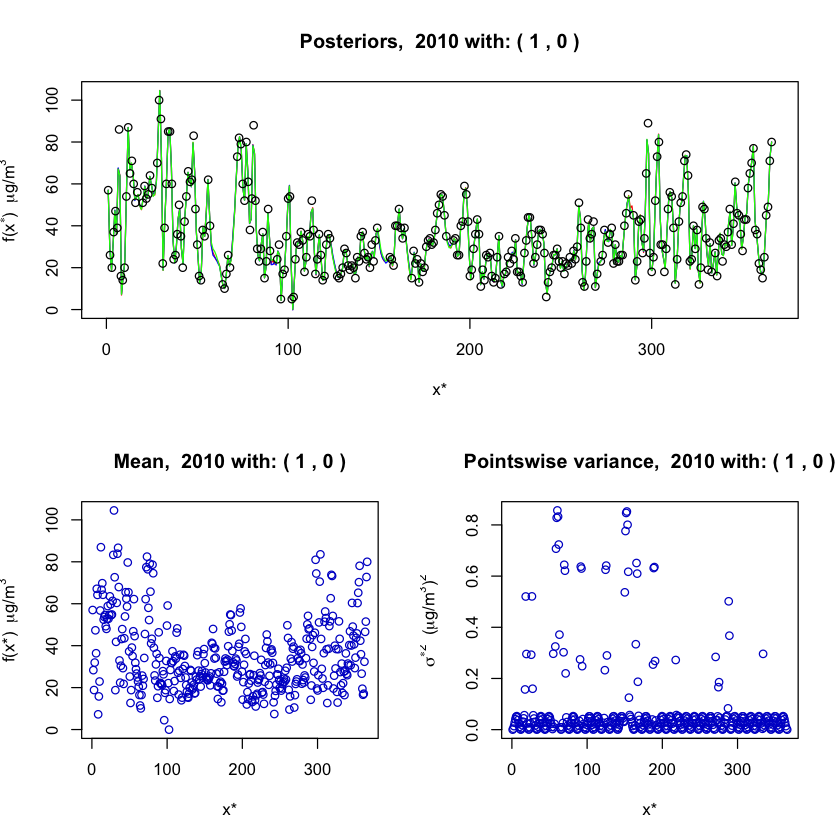

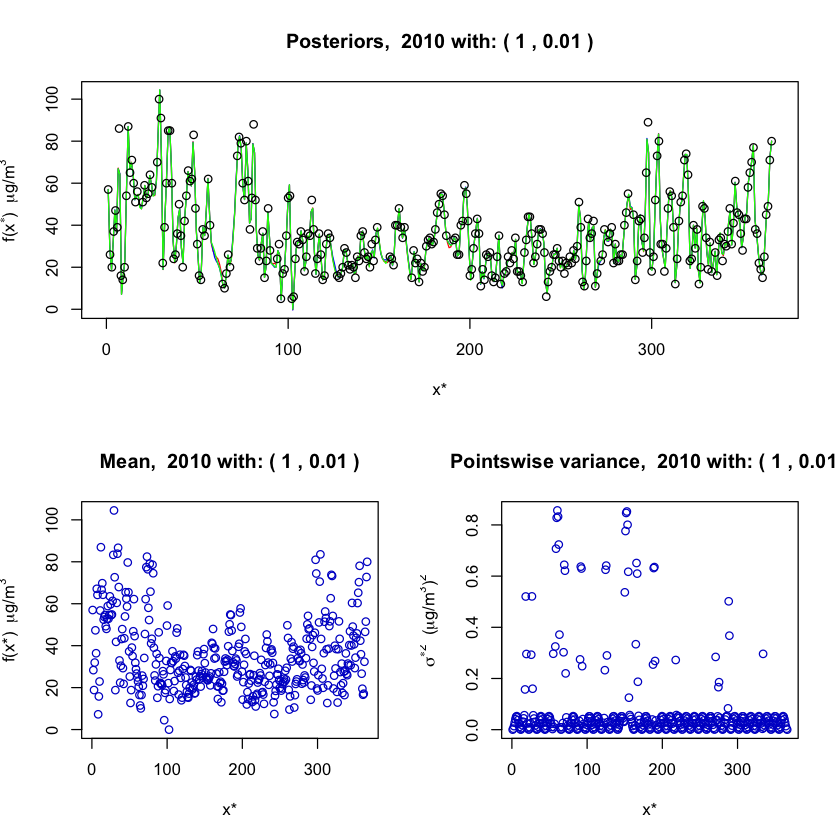

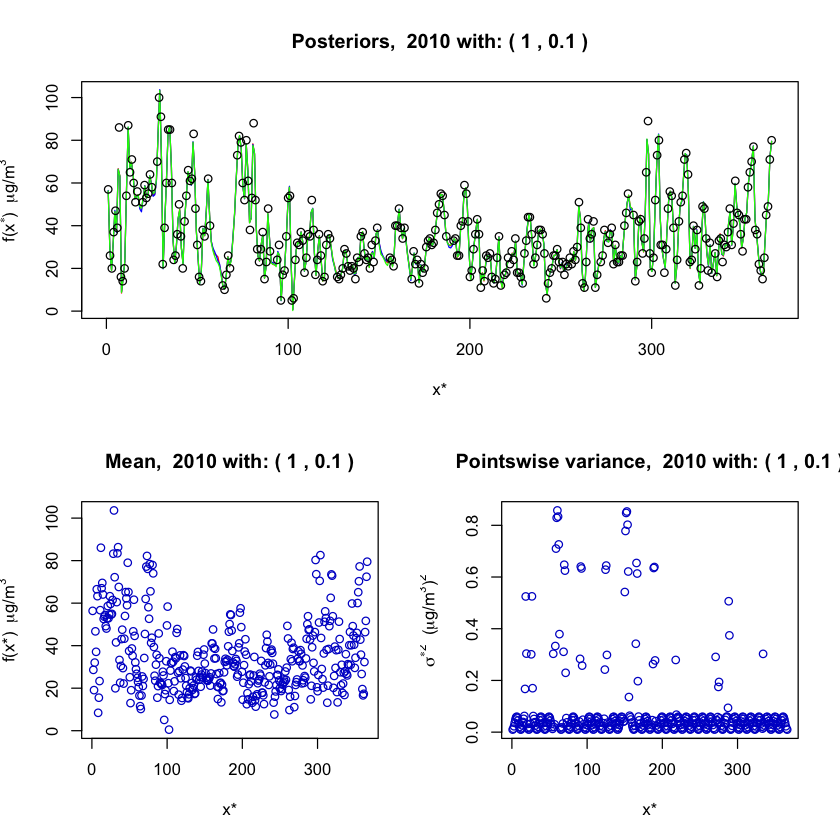

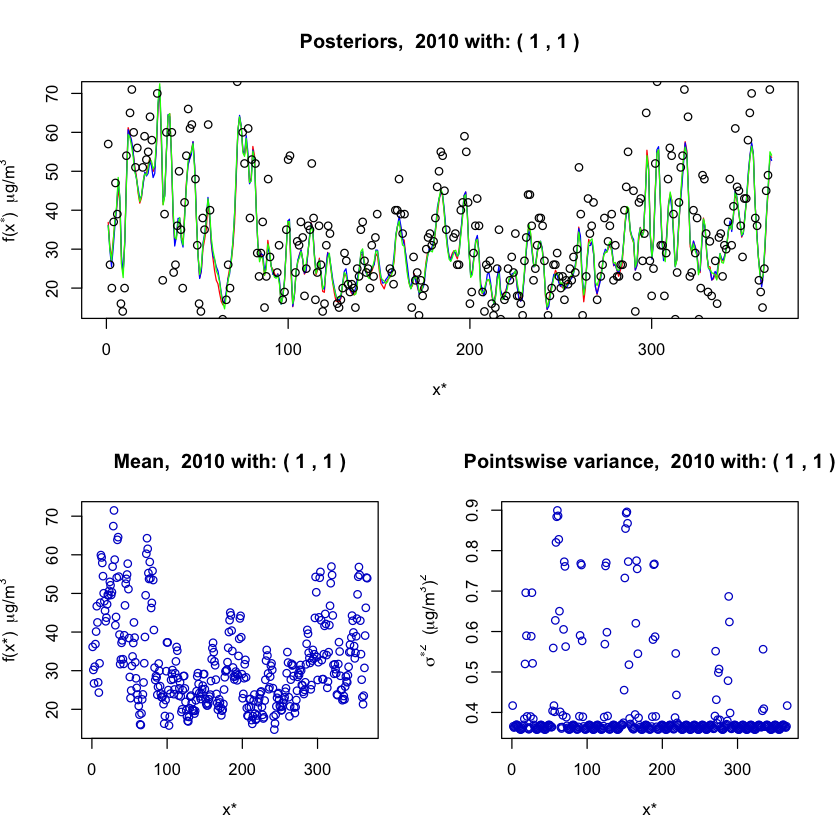

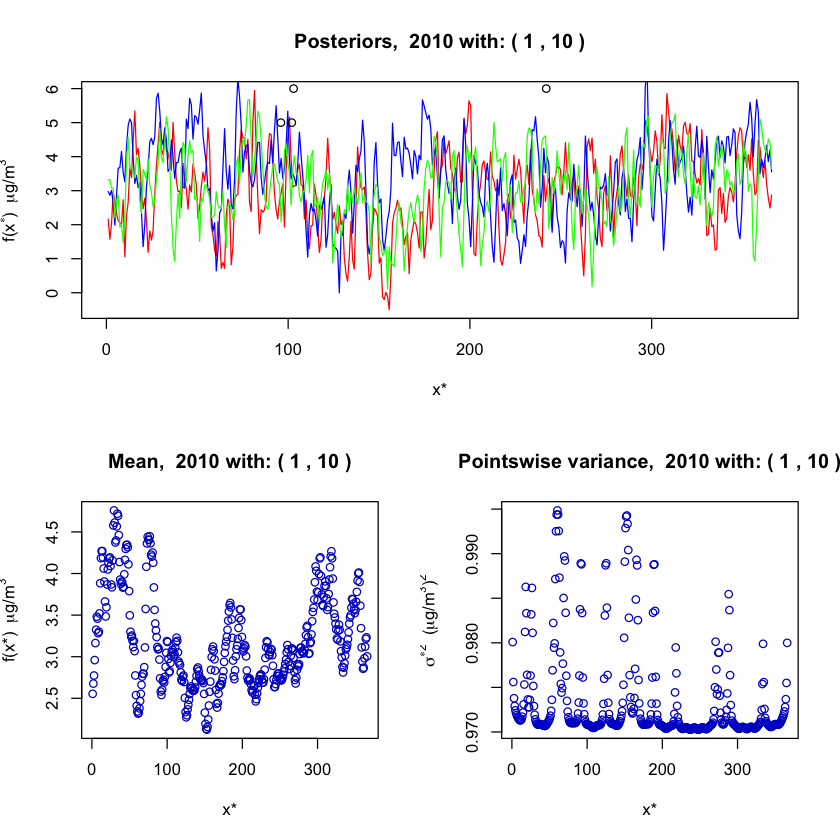

In [24]:
m <- matrix(c(1,1,2,3),nrow = 2,ncol = 2,byrow = TRUE)
layout(mat = m)
GaussianProcess(data$X2010, InverseMQuadratic, 1, 0,'nyyy')
for (i in seq(-2,1)) {
    m <- matrix(c(1,1,2,3),nrow = 2,ncol = 2,byrow = TRUE)
    layout(mat = m)
    GaussianProcess(data$X2010, InverseMQuadratic, 1, 10^i,'nyyy')
    }

#### 2) Keeping fixed the measurement error, we vary the hyperparameter.

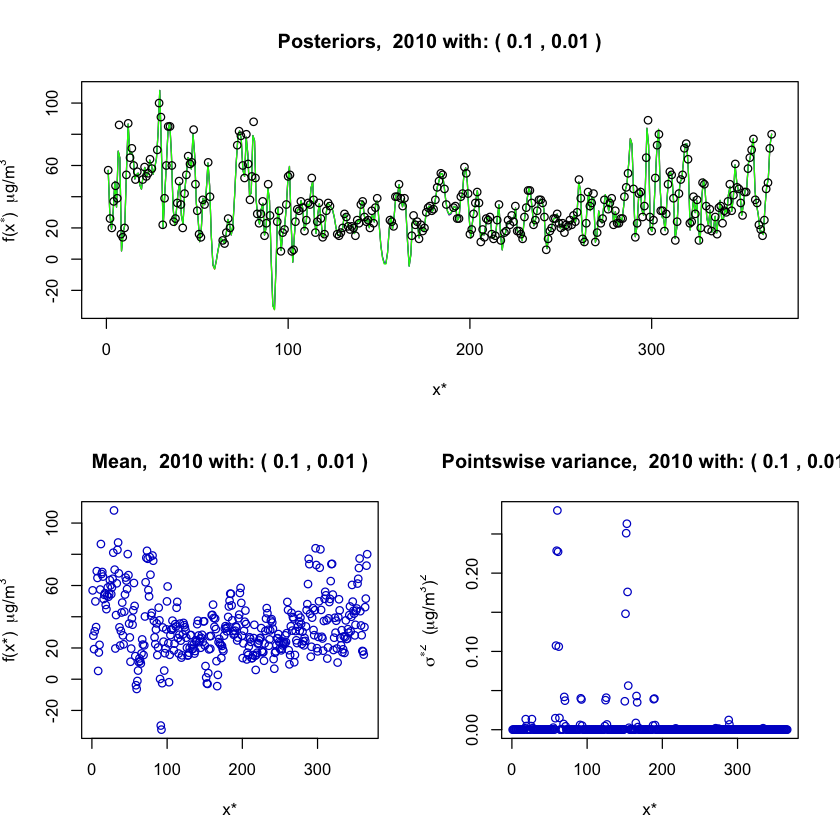

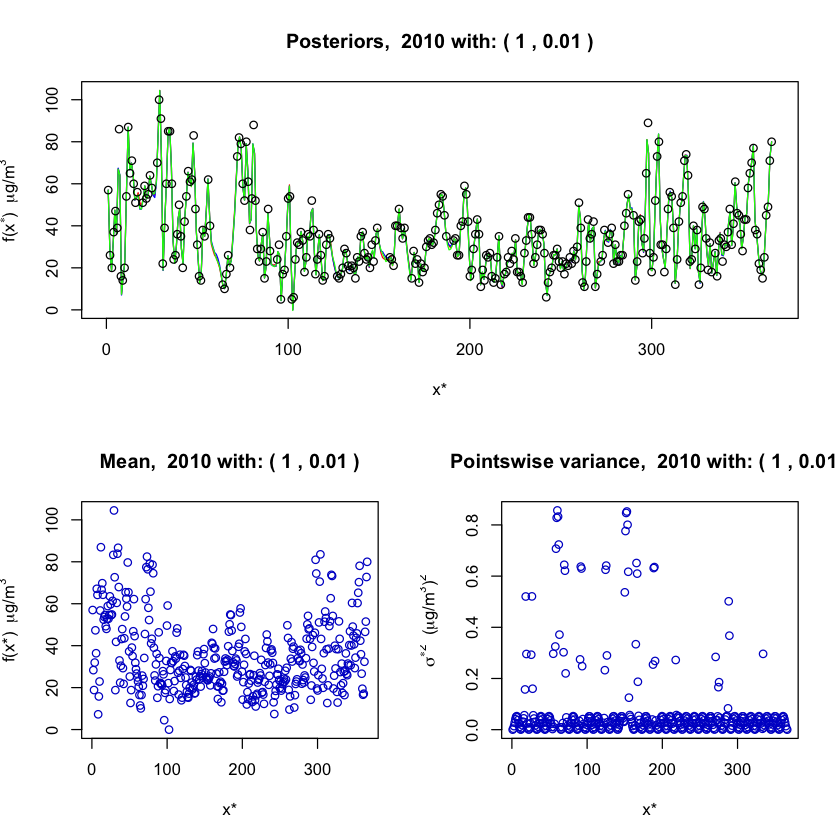

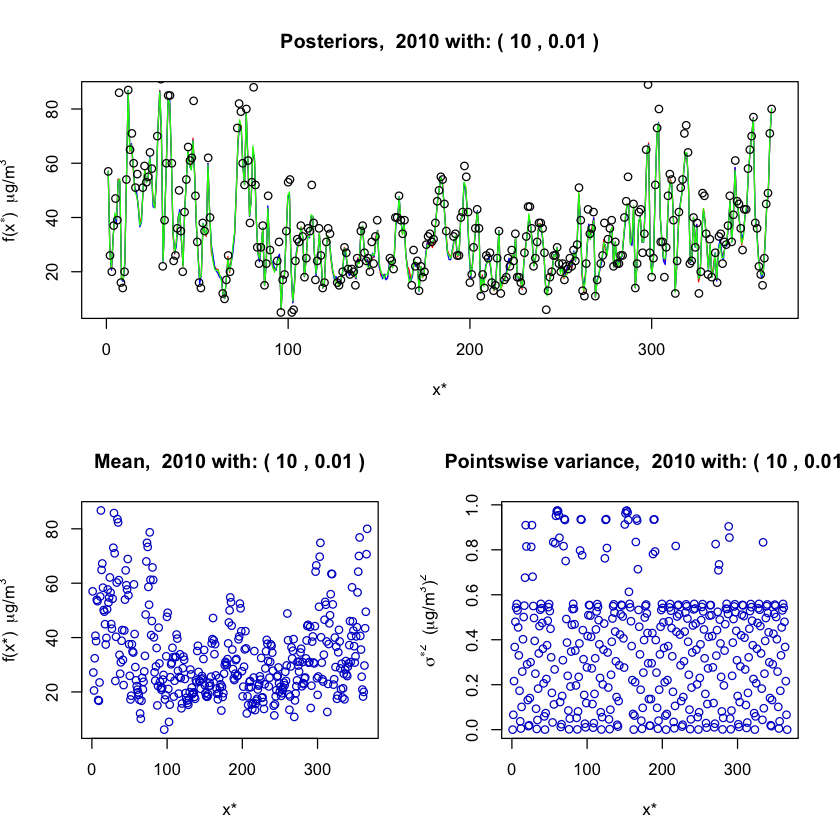

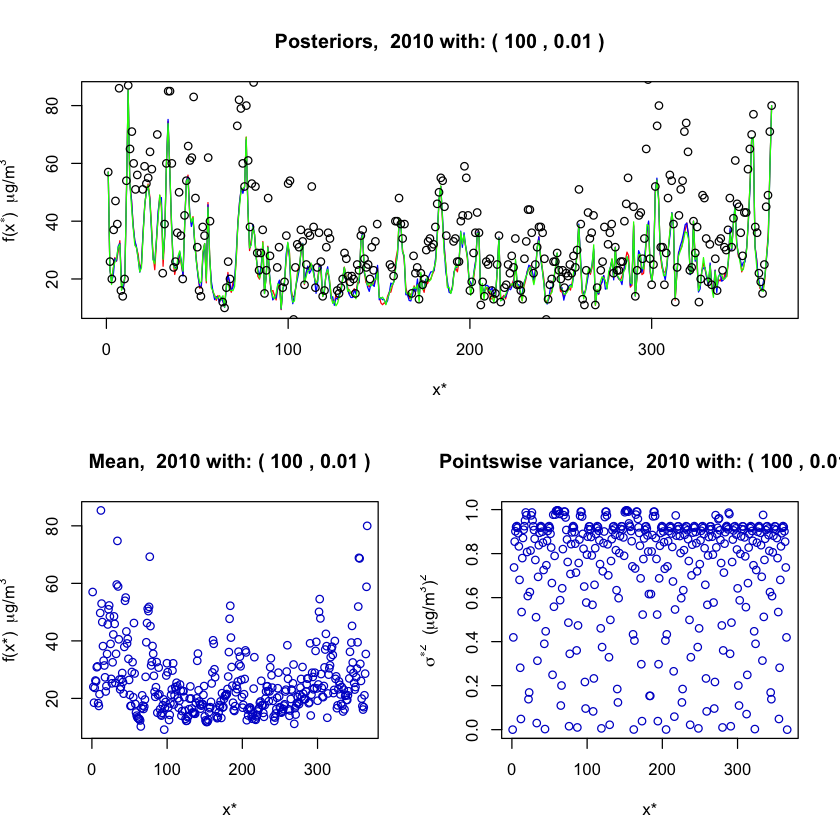

In [25]:
for (i in seq(-1,2)) {
    m <- matrix(c(1,1,2,3),nrow = 2,ncol = 2,byrow = TRUE)
    layout(mat = m)
    GaussianProcess(data$X2010, InverseMQuadratic, 10^i, 0.01,'nyyy')
    }

For the same considerations done above, the best parameters are: $\sigma=0.01$ and $e=1$.

### Summary of the three kernels

Prior and posterior confrontation. Just graphically it is clear that the posteriors are very close.

**Priors**

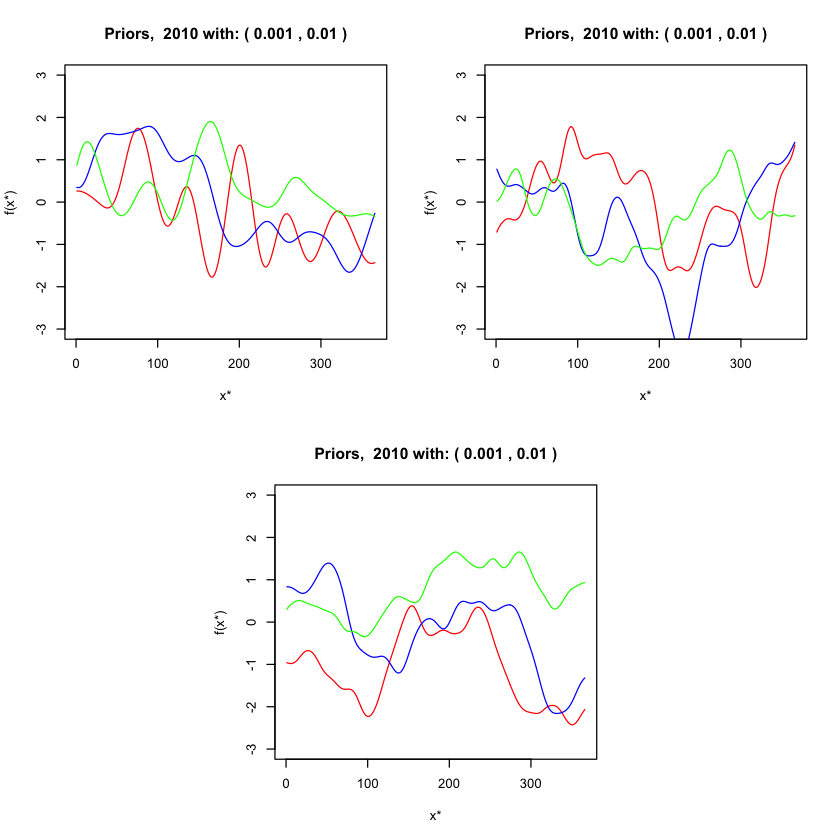

In [26]:
m <- matrix(c(1,1,2,2,0,3,3,0),nrow = 2,ncol = 4,byrow = TRUE)
layout(mat = m)
#parameters
e <- 0.001
s <- 0.01
#GP with different kernel
GaussianProcess(data$X2010, Gaussian, e, s,'ynnn')
GaussianProcess(data$X2010, InverseQuadratic, e, s,'ynnn')
GaussianProcess(data$X2010, InverseMQuadratic, e, s,'ynnn')

Since the kernel is different, the priors are different too.

**Posteriors**

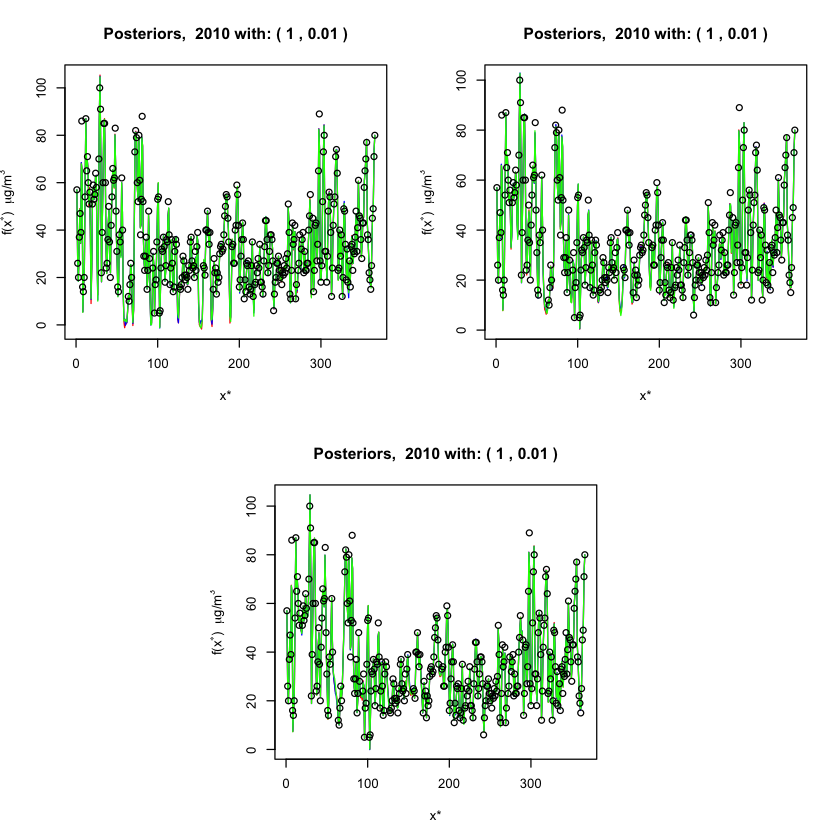

In [27]:
m <- matrix(c(1,1,2,2,0,3,3,0),nrow = 2,ncol = 4,byrow = TRUE)
layout(mat = m)
#parameters
e <- 1
s <- 0.01
#GP with different kernel
GaussianProcess(data$X2010, Gaussian, e, s,'nynn')
GaussianProcess(data$X2010, InverseQuadratic, e, s,'nynn')
GaussianProcess(data$X2010, InverseMQuadratic, e, s,'nynn')

The posteriors are really similar because we have a lot of data: the priors do not change the result.